In [1]:
#import spikeinterface modules
import spikeinterface as si
import spikeinterface.extractors as se
import spikeinterface.toolkit as st
import spikeinterface.sorters as ss
import spikeinterface.comparison as sc
import spikeinterface.widgets as sw
import numpy as np
from numpy import asarray
import glob

#import everything else
import os
import sys
import numpy as np
import neo
import pandas as pd
import scipy

# MCS
import McsPy
import McsPy.McsData
import McsPy.McsCMOS
from McsPy import ureg, Q_

# Plotting
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import seaborn as sns

#SK Learn
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#networkx
import plotly.graph_objects as go
import networkx as nx
import matplotlib.patches as mpatches

from time import strftime
%matplotlib notebook



## Notebook from Spiketrains --> Bursts via ISI Detection

In [35]:
working_directory = r"D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\analysis_03_HCx_GFP_B_aCSF_post"

output_directory = r"D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\analysis_03_HCx_GFP_B_aCSF_post"

In [36]:
os.chdir(working_directory)

In [37]:
filename= '03_HCx_GFP_B_aCSF_post'

In [38]:
filelist = glob.glob('*'+filename+'*.npy')


In [39]:
filelist

['03_HCx_GFP_B_aCSF_post_0_to_120_completerecording_full_spikedic.npy',
 '03_HCx_GFP_B_aCSF_post_full_spikedic.npy',
 'infodics_03_HCx_GFP_B_aCSF_post.npy']

In [40]:
filelist

['03_HCx_GFP_B_aCSF_post_0_to_120_completerecording_full_spikedic.npy',
 '03_HCx_GFP_B_aCSF_post_full_spikedic.npy',
 'infodics_03_HCx_GFP_B_aCSF_post.npy']

In [41]:
file_spikedic = glob.glob('*spikedic*')[1]
file_infodic = glob.glob('*info*')[0]

In [42]:
file_spikedic

'03_HCx_GFP_B_aCSF_post_full_spikedic.npy'

In [43]:
# das hier im Anschluss mit dem Complete Spikedic Ersetzen

spikedic_MAD = np.load(file_spikedic, allow_pickle=True).item()
infodic = np.load(file_infodic, allow_pickle=True).item()

In [44]:
infodic
lastkey = list(infodic.keys())[-1]

In [45]:
infodic = infodic[lastkey]

In [46]:
# we gather the general information


tick = infodic['tick']
# the timelength recording must be set to 120 seconds if we observe
timelengthrecording_s = infodic['timelengthrecording_s']
first_recording_timepoint = infodic['first_recording_timepoint']
scale_factor_for_second = infodic['scale_factor_for_second']
scale_factor_for_milisecond = scale_factor_for_second/1000


#### Definition of all Functions for the Interspike Interval Method


In [47]:
def create_bins(lower_bound, width, quantity):
    """ create_bins returns an equal-width (distance) partitioning. 
        It returns an ascending list of tuples, representing the intervals.
        A tuple bins[i], i.e. (bins[i][0], bins[i][1])  with i > 0 
        and i < quantity, satisfies the following conditions:
            (1) bins[i][0] + width == bins[i][1]
            (2) bins[i-1][0] + width == bins[i][0] and
                bins[i-1][1] + width == bins[i][1]
    """
    

    bins = []
    for low in range(lower_bound, 
                     lower_bound + quantity*width + 1, width):
        bins.append((low, low+width))
    return bins


def find_bin(value, bins):
    """ bins is a list of tuples, like [(0,20), (20, 40), (40, 60)],
        binning returns the smallest index i of bins so that
        bin[i][0] <= value < bin[i][1]
    """
    
    for i in range(0, len(bins)):
        if bins[i][0] <= value < bins[i][1]:
            return i
    return -1



def find_binned_spikes(data, bins):
    '''
    Parameters
    ----------
    data : for network spike binning --> expects an 1D array with all spikes detected for the network
    bins : list of tuples of expected bins

    Returns
    -------
    binlist : list of lists where lists contain all spikes for the respective bins

    '''
    binlist =[]
    binspike =[]
    for i in range(0, len(bins)):
        binspike = []
        for a in data:    
            if bins[i][0] <= a < bins[i][1]:
                binspike.append(a)
        binlist.append(binspike)
            
    return binlist




def get_isi_singlechannel(spikedic, tick):
    '''
    Parameters
    ----------
    spikedic : dictionary with all detected spikes for a channel
        DESCRIPTION.

    Returns
    -------
    isidic : keys = channels, values = List of tuples where tuple[0]=detected spike and tuple[1]=isi to the next detected spike
    isi_alone_dic : keys = channels, values = list of isi alone
    CAVE returns are in microseconds
    '''
    
    isidic ={}     
    isilist = []
    isi_alone_dic = {}
    isislist =[]

    for key in spikedic:
        isilist = []
        isislist = []
        if len(spikedic[key])>=2:
            for i in range(0, (len(spikedic[key])-1)):
                isi = spikedic[key][i]*tick, (spikedic[key][i+1]-spikedic[key][i])*tick #CL tick für beide dazu
                isi_alone = (spikedic[key][i+1]-spikedic[key][i])*tick
                isilist.append(isi)
                isislist.append(isi_alone)
        isidic[key]=isilist
        isi_alone_dic[key]=isislist
        
    return isidic, isi_alone_dic



def bin_isi(isi_alone_dic, binsize, binmax=bool, binmaxnumber=None):
    '''

    Parameters
    ----------
    isi_alone_dic : dic
        dictionary with all ISI for every channel
    binsize: int
        expects int in microseconds that defines bin-width
    Returns
    -------
    histo_ISI_dic:
        dic with key:channellabel, value: list with bincounts per bin

    '''
    isi_bins = []
    isi_bins_list = []
    isi_bin_count = []
    histo_ISI_dic = {}
    for key in isi_alone_dic:
        if binmax==True:
            isi_bin_count=[]
            isibins=create_bins(0, binsize, binmaxnumber)
            isi_bins_list=[] 
            for i in range(0, len(isibins)):
                isi_bins=[]
                for a in isi_alone_dic[key]:
                    if isibins[i][0] <= a < isibins[i][1]:
                        isi_bins.append(a)
                isi_bins_list.append(isi_bins)
            for i in range(0, (len(isi_bins_list)-1)):
                isi_bin_count.append(len(isi_bins_list[i]))
            histo_ISI_dic[key]=isi_bin_count
        #else:
            # noch schreiben für variable maximalnummer an bins
            
    return histo_ISI_dic


def bin_lnisi(isi_alone_dic, start_in_microseconds, stop_in_microseconds, totalbins, binmax):
    '''

    Parameters
    ----------
    isi_alone_dic : dic
        dictionary with all ISI for every channel 
    binsize: int
        expects int in microseconds that defines bin-width
    Returns
    -------
    histo_ISI_dic:
        dic with key:channellabel, value: list with bincounts per logarithmic spaced bins

    '''
    isi_bins = []
    isi_bins_list = []
    isi_bin_count = []
    histo_ln_ISI_dic = {}
    for key in isi_alone_dic:
        if binmax==True:
            isi_bin_count=[]
            isibins=create_ln_bins(start_in_microseconds, stop_in_microseconds, totalbins)
            isi_bins_list=[] 
            for i in range(0, len(isibins)):
                isi_bins=[]
                for a in isi_alone_dic[key]:
                    if isibins[i][0] <= a < isibins[i][1]:
                        isi_bins.append(a)
                isi_bins_list.append(isi_bins)
            for i in range(0, (len(isi_bins_list)-1)):
                isi_bin_count.append(len(isi_bins_list[i]))
            histo_ln_ISI_dic[key]=isi_bin_count
        #else:
            # noch schreiben für variable maximalnummer an bins
            
    return histo_ln_ISI_dic, isibins


def get_allchannel_ISI_bins(histo_ISI_dic):
    '''
    Parameters
    ----------
    histo_ISI_dic : dic mit den einzelnen ISI für jeden Channel. Cave, die Values müssen alle die gleiche
                    Länge haben, sonst funktioniert die zip Funktion nicht.
        DESCRIPTION.

    Returns
    -------
    network_ISI_binned = array of all ISI of the whole network binned

    '''
    network_ISI = []
    for key in histo_ISI_dic:
        list1 = histo_ISI_dic[key]
        if len(list1)>len(network_ISI):
            network_ISI=list1
        else:
            list2 = network_ISI
            network_ISI = [a + b for a, b in zip(list1, list2)]
    return np.array(network_ISI)


def get_burst_threshold(df_with_CMA):
    '''
    

    Parameters
    ----------
    df_with_CMA : TYPE
        DESCRIPTION.

    Returns
    -------
    CMAalpha : TYPE
        DESCRIPTION.
    CMAalpha2 : TYPE
        DESCRIPTION.
    maxCMA : TYPE
        DESCRIPTION.
    alpha1 : TYPE
        DESCRIPTION.
    alpha2 : TYPE
        DESCRIPTION.

    '''
    
    networkburstthreshold_ISI = 200000 #wie im paper maximal bei 200 ms als isi
    skewness = scipy.stats.skew(network_ISI)
    if skewness < 1:
        alpha1 = 1
        alpha2 = 0.5
    elif skewness >= 1 and skewness <4:
        alpha1 = 0.7
        alpha2 = 0.3
    elif skewness >=4 and skewness <9:
        alpha1 = 0.5
        alpha2 = 0.3
    elif skewness >=9:
        alpha1 = 0.3
        alpha2 = 0.1
    maxCMA = max(df_with_CMA['CMA'])
    CMAalpha = maxCMA*alpha1
    CMAalpha2 = maxCMA*alpha2
    return CMAalpha, CMAalpha2, maxCMA, alpha1, alpha2


def ISI_threshold_min(df_with_CMA, CMAalpha, CMAalpha2, binsize_in_micros):
    '''
    '''
    indexfactor = df[df['CMA']>CMAalpha].index[-1] + 1
    indexfactor2 = df[df['CMA']>CMAalpha2].index[-1] + 1
    threshold_intraburst = float(indexfactor*binsize_in_micros)
    threshold_burst_related = float(indexfactor2*binsize_in_micros)
    
    return threshold_intraburst, threshold_burst_related


def find_burst_starts(isi_alone, threshold_intraburst, spikedic):
    '''
    Parameters
    ----------
    isi_alone : TYPE
        DESCRIPTION.
    threshold_intraburst : TYPE
        DESCRIPTION.
    spikedic : TYPE
        DESCRIPTION.

    Returns
    -------
    None.

    '''
    burststartdic = {}
    noburstlist = []
    #burststartlist = []
    for key in isi_alone:
        #print(key)
        if len(isi_alone[key])<3:
            noburstlist.append(isi_alone[key])
        burststartlist=[]
        counter = 0
        while counter < (len(isi_alone[key])-4):
            setter = 0
            if isi_alone[key][counter]<threshold_intraburst:
                setter +=1
                if isi_alone[key][counter+setter] < threshold_intraburst:
                    setter +=1
                    if isi_alone[key][counter+setter] < threshold_intraburst:
                        burststartlist.append((spikedic[key][counter])*tick) #CL: zusätzlich times tick to get all timestamps in ms
                        setter += 1
                        while isi_alone[key][counter+setter]<threshold_intraburst and (counter+setter)< (len(isi_alone[key])-4):
                            setter +=1
                            #print('burst '+str(setter))
                        setter +=1
                    else:
                        counter +=1
                else:
                    counter +=1
                counter = counter + setter + 1
            else:
                counter +=1
            #print(str(key) + str(counter))
        burststartdic[key]=burststartlist
        
    return burststartdic   


def find_burst_starts_and_length(isi_alone, threshold_intraburst, spikedic):
    '''
    Parameters
    ----------
    isi_alone : TYPE
        DESCRIPTION.
    threshold_intraburst : TYPE
        DESCRIPTION.
    spikedic : TYPE
        DESCRIPTION.

    Returns
    -------
    None.

    '''
    burststartdic = {}
    noburstlist = []
    #burststartlist = []
    for key in isi_alone:
        #print(key)
        if len(isi_alone[key])<3:
            noburstlist.append(isi_alone[key])
        burststartlist=[]
        counter = 0
        while counter < (len(isi_alone[key])-4):
            setter = 0
            if isi_alone[key][counter]<threshold_intraburst:
                setter +=1
                if isi_alone[key][counter+setter] < threshold_intraburst:
                    setter +=1
                    if isi_alone[key][counter+setter] < threshold_intraburst:
                        burststart_spike = spikedic[key][counter]*tick
                        burstend_spike = spikedic[key][counter+setter]*tick
                        #burststartlist.append((spikedic[key][counter])*tick) #CL: zusätzlich times tick to get all timestamps in ms
                        setter += 1
                        while isi_alone[key][counter+setter]<threshold_intraburst and (counter+setter)< (len(isi_alone[key])-4):
                            setter +=1
                            burstend_spike = spikedic[key][counter+setter]*tick
                            #print('burst '+str(setter))
                        burststartlist.append((burststart_spike, burstend_spike))
                        setter +=1
                    else:
                        counter +=1
                else:
                    counter +=1
                counter = counter + setter + 1
            else:
                counter +=1
            #print(str(key) + str(counter))
        burststartdic[key]=burststartlist
        
    return burststartdic   


### ISI Burst Detection

In [48]:
# we st_channel is the dictionary with all spikes per channel
st_channel = spikedic_MAD

In [49]:
binsize_for_ISI = 5000 #in microseconds

In [50]:
isidic, isi_alone = get_isi_singlechannel(st_channel, tick) #creates two dictionaries
histo_ISI_dic=bin_isi(isi_alone, binsize=binsize_for_ISI, 
                      binmax=True, binmaxnumber=200) # dictionary für jeden channel mit 300x 10ms bins (binsize) und der Menge an ISI für die jeweilige Länge
network_ISI=get_allchannel_ISI_bins(histo_ISI_dic) #gibt ein array mit bins entsprechend der bins aus der Vorfunktion


In [51]:
colors = ['green', 'blue', 'orange', 'purple']

<IPython.core.display.Javascript object>


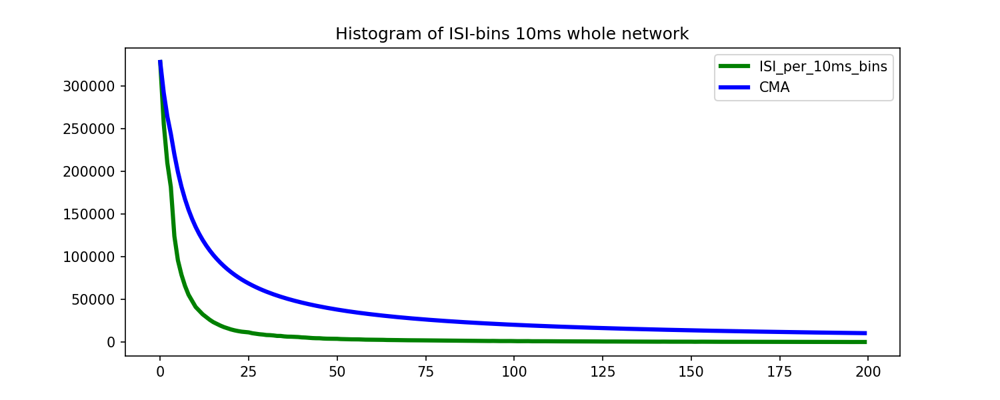

<AxesSubplot:title={'center':'Histogram of ISI-bins 10ms whole network'}>

In [52]:
df= pd.DataFrame({'ISI_per_10ms_bins':network_ISI}) #aus Network_ISI wird ein pdDF um die weiteren Schritte durchführen zu können
df["CMA"] = df.ISI_per_10ms_bins.expanding().mean()
df[['ISI_per_10ms_bins', 'CMA']].plot(color=colors, linewidth=3, 
                                      figsize=(10,4), 
                                      title="Histogram of ISI-bins 10ms whole network")

In [53]:
# next calculation of the adaptive thresholds:
CMAalpha, CMAalpha2, maxCMA, alpha1, alpha2=get_burst_threshold(df) # threshold calculation
threshold_intraburst, threshold_burst_related = ISI_threshold_min(df, CMAalpha, 
                                                                  CMAalpha2, binsize_for_ISI) #set thresholds

In [54]:
CMAalpha, CMAalpha2, maxCMA, alpha1, alpha2

(163900.0, 98340.0, 327800.0, 0.5, 0.3)

10ms: (544.5, 181.5, 1815.0, 0.3, 0.1)


5ms: (357.3, 119.10000000000001, 1191.0, 0.3, 0.1)

1ms: (112.89999999999999, 37.63333333333333, 376.3333333333333, 0.3, 0.1)

0.5ms (61.08, 20.36, 203.6, 0.3, 0.1)

0.1ms (51.5, 30.9, 103.0, 0.5, 0.3)

In [55]:
threshold_intraburst, threshold_burst_related

(40000.0, 80000.0)

10ms threshold_intraburst 50000, 230000

5ms threshold_intraburst: 35000 , related 145000

1ms intraburst: 20000, related: 80.000

0.5ms intraburst 35.000, related: 145.000

Single channel bursts were calculated using an adapted version of the Network-CMA method proposed by Välkki and colleagues (Välkki et al. 2017): In brief, interspike-intervals (ISI) of each recording were binned in 5ms bins and a cumulative moving-average over the resulting histogram was calculated. The maximum value of the CMA (maximal CMA) was then used to calculate the maximal ISI between at spikes of one channel: Depending on the skewness of the histogram, the maximal CMA was modified with a cofactor alpha to identify the threshold for intraburst ISI (0.3 < alpha < 1 ) and burst-related ISI (0.1 < alpha < 0.5). Since we were interested in spatial networks, we decided to define single-channel bursts as a sequence of at least 3 consecutive spikes with an ISI below the calculated burst related ISI. To improve comparability between recordings, we defined a range from 60 - 140 ms as reasonable values for burst-related ISI. Thus, we hope to use the best of both worlds for single channel burst detection: Leveraging the adaptability of the Network-CMA method while ensuring comparability between variably-active slices. 


In [56]:
final_threshold = 0

if threshold_burst_related > 140000:
    final_threshold = 140000
elif threshold_burst_related < 60000:
    final_threshold = 60000
else:
    final_threshold = threshold_burst_related

In [57]:
print('The final threshold for this recoding is: %s' %final_threshold)
    
    

The final threshold for this recoding is: 80000.0


In [58]:
burststart_end_dic = find_burst_starts_and_length(isi_alone, final_threshold, st_channel) 

<IPython.core.display.Javascript object>


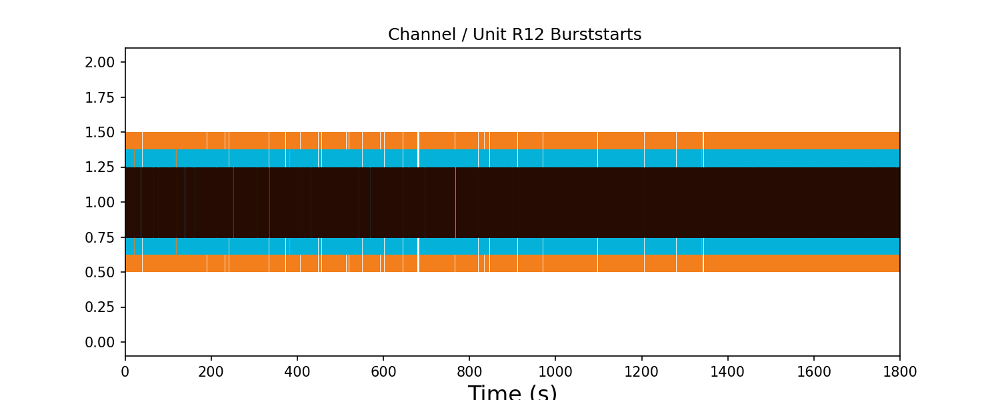

<IPython.core.display.Javascript object>


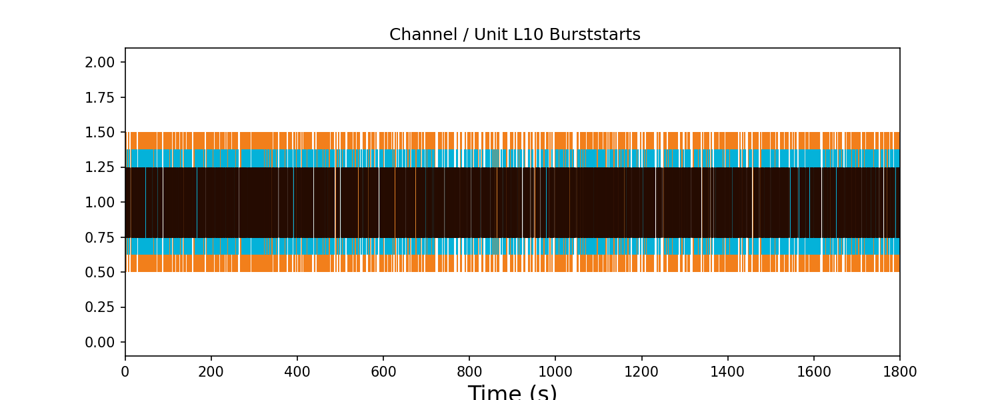

<IPython.core.display.Javascript object>


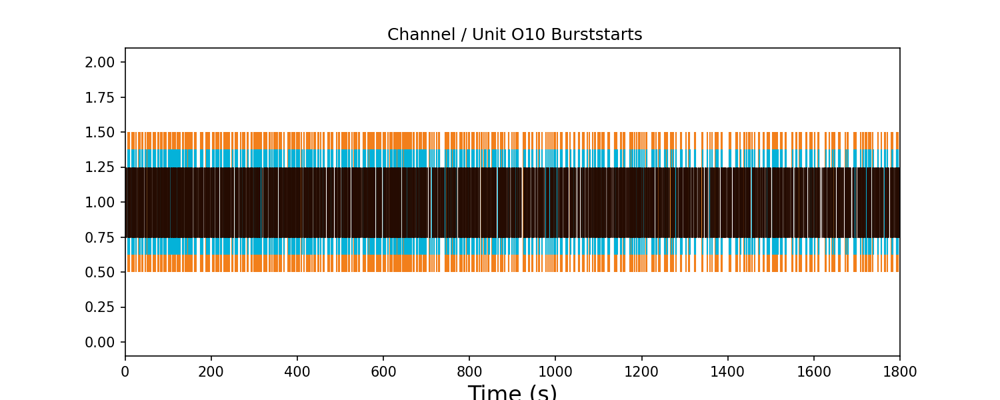

<IPython.core.display.Javascript object>


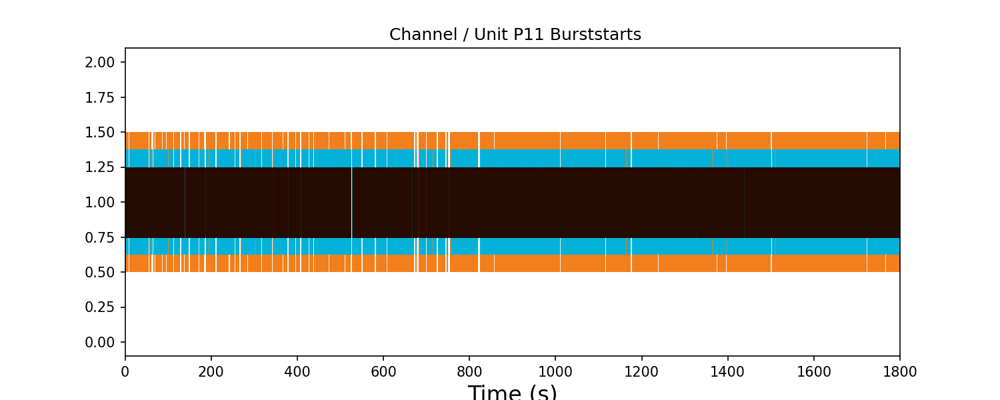

<IPython.core.display.Javascript object>


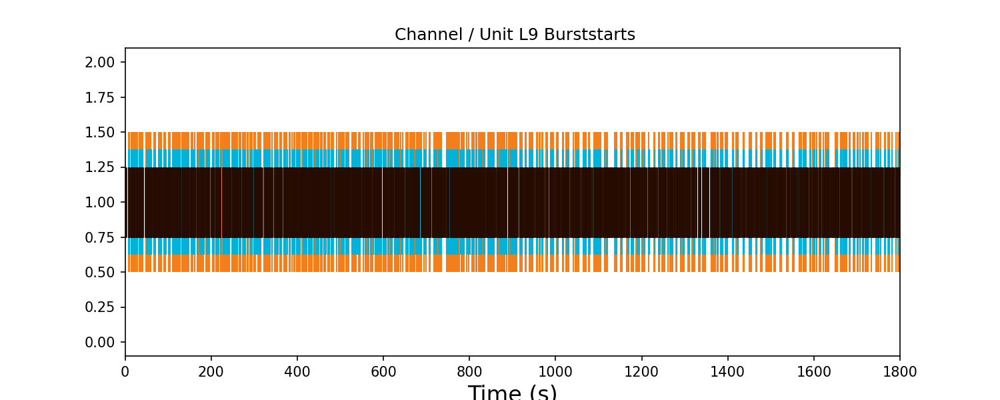

<IPython.core.display.Javascript object>


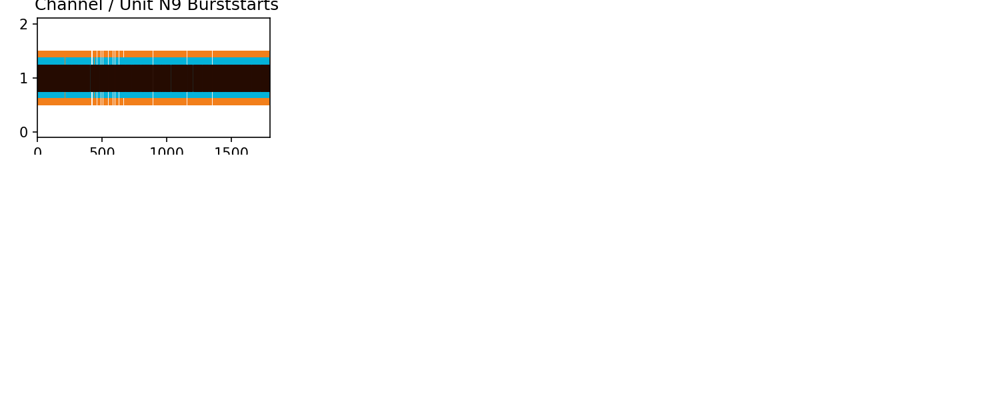

<IPython.core.display.Javascript object>


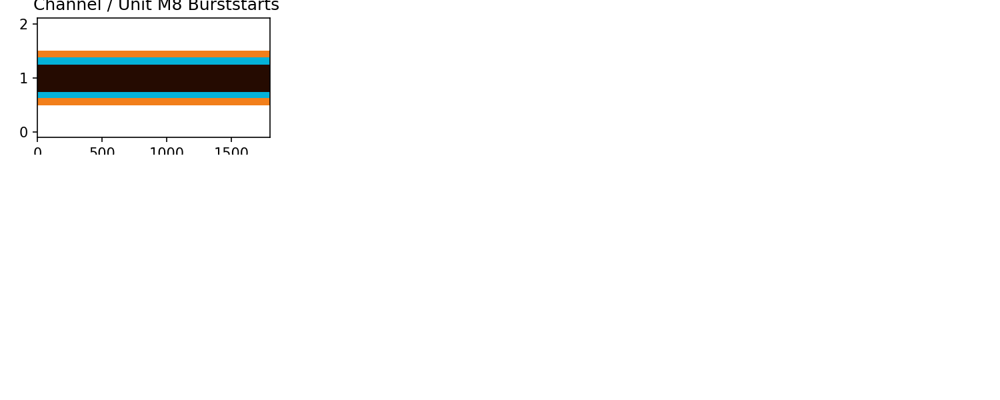

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


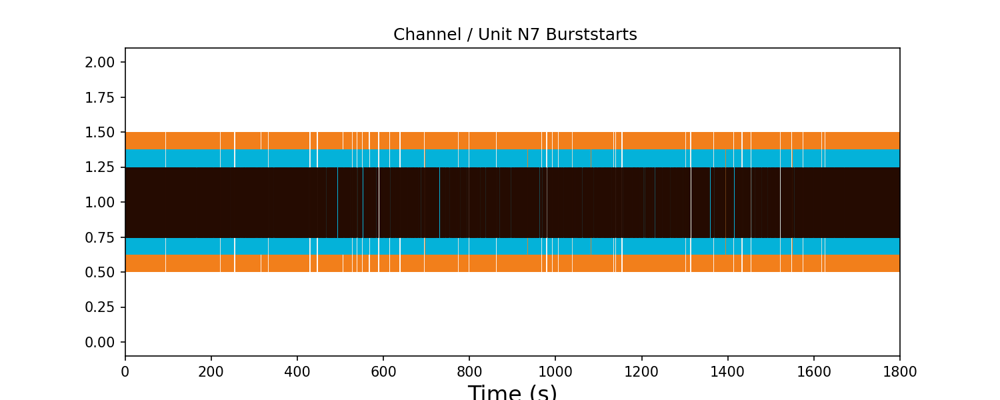

<IPython.core.display.Javascript object>


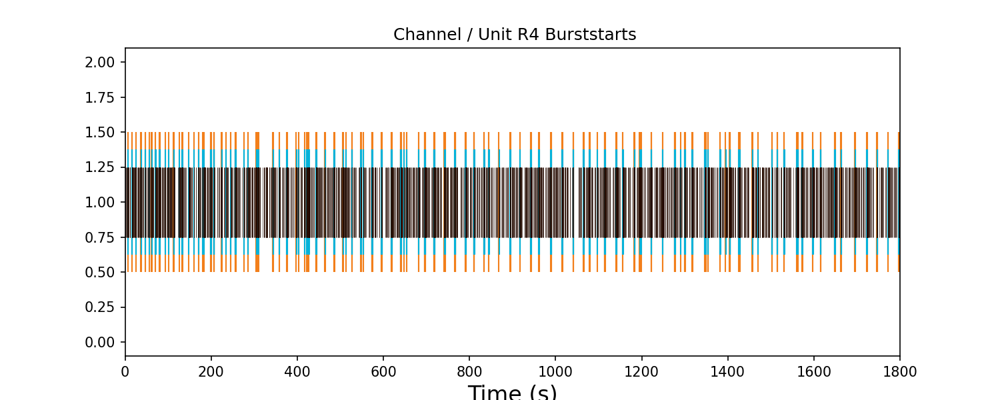

<IPython.core.display.Javascript object>


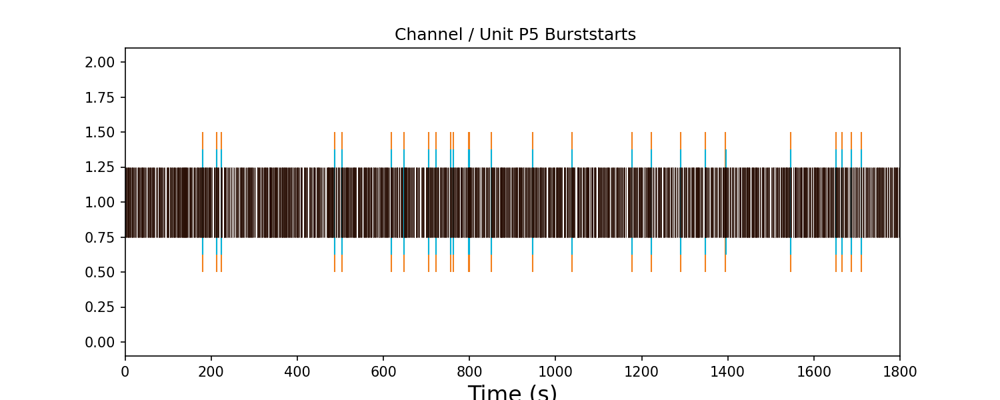

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


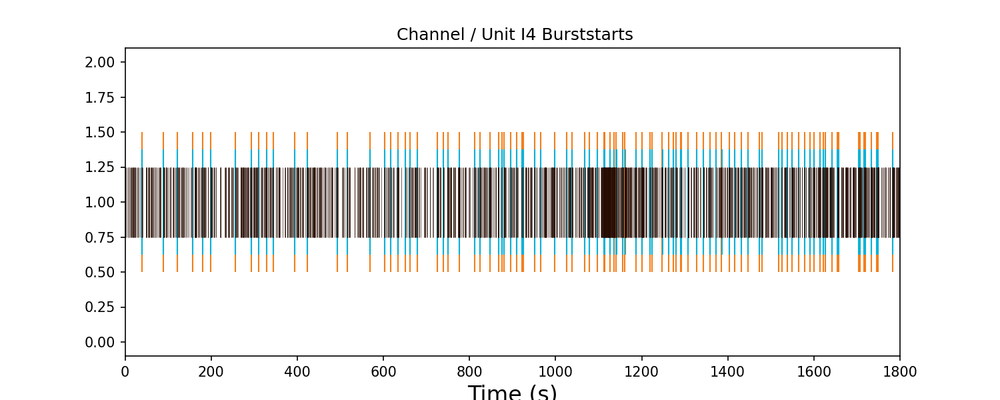

<ipython-input-59-c10bdbbd3ec2>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 4))


<IPython.core.display.Javascript object>


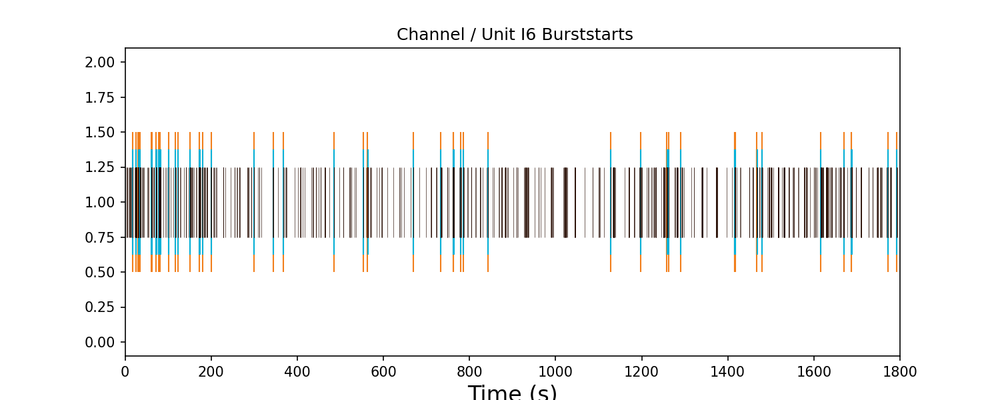

<IPython.core.display.Javascript object>


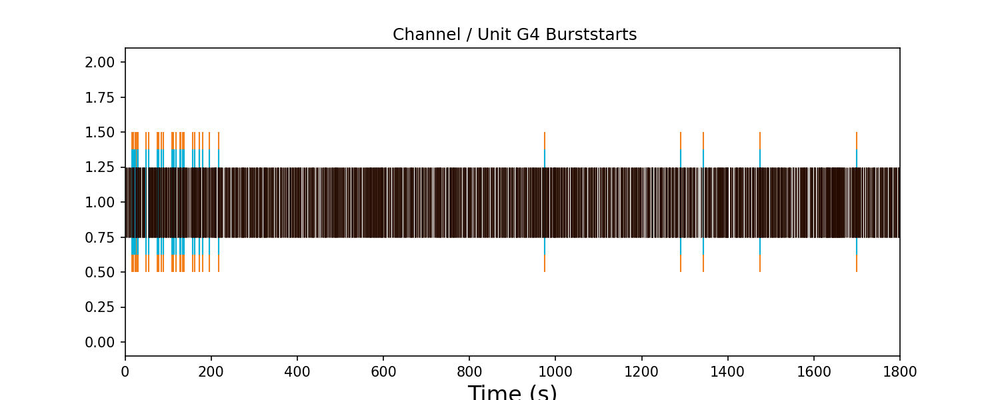

<IPython.core.display.Javascript object>


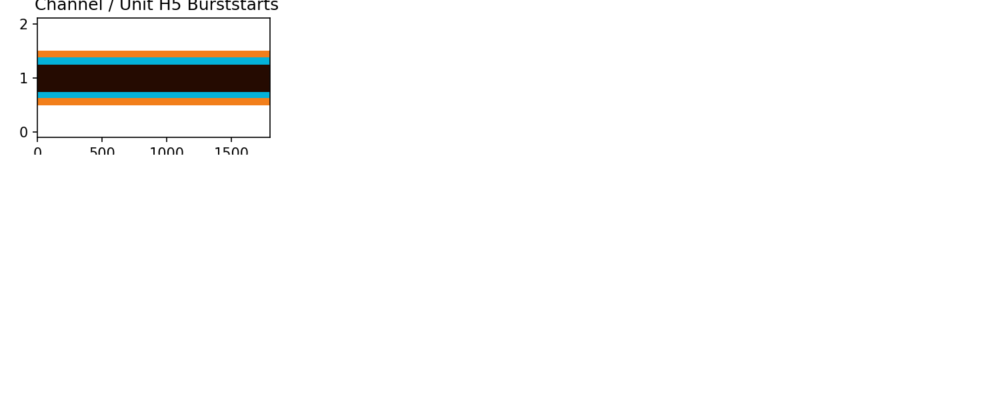

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


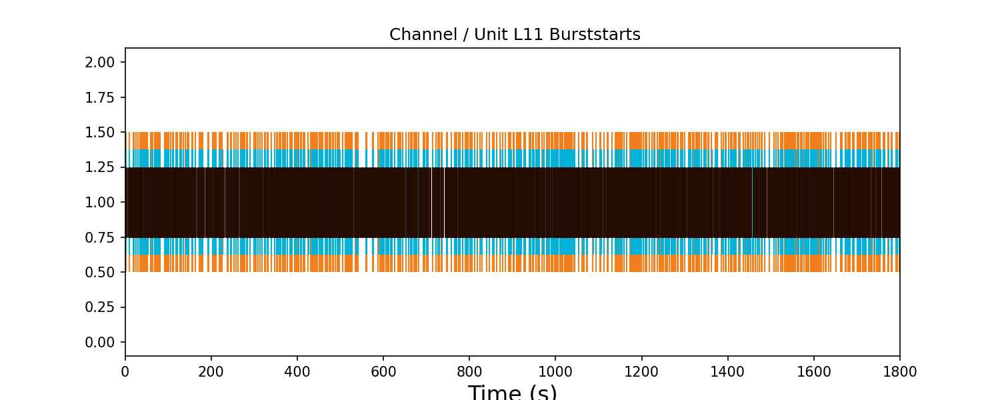

<IPython.core.display.Javascript object>


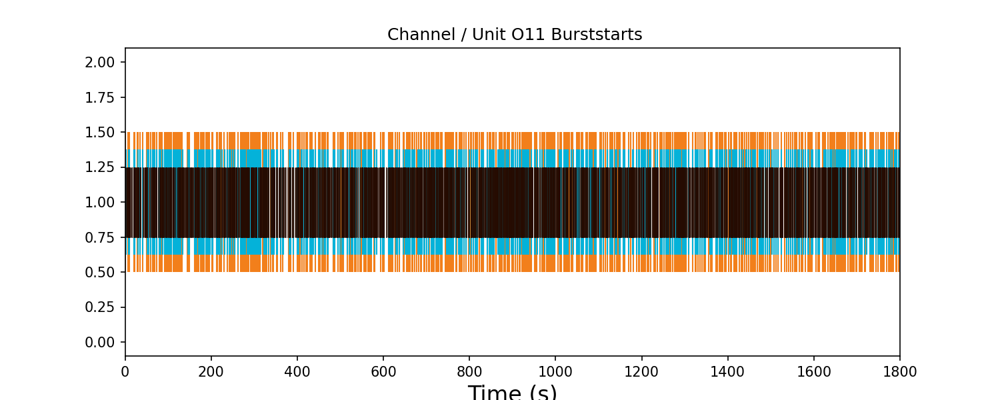

<IPython.core.display.Javascript object>


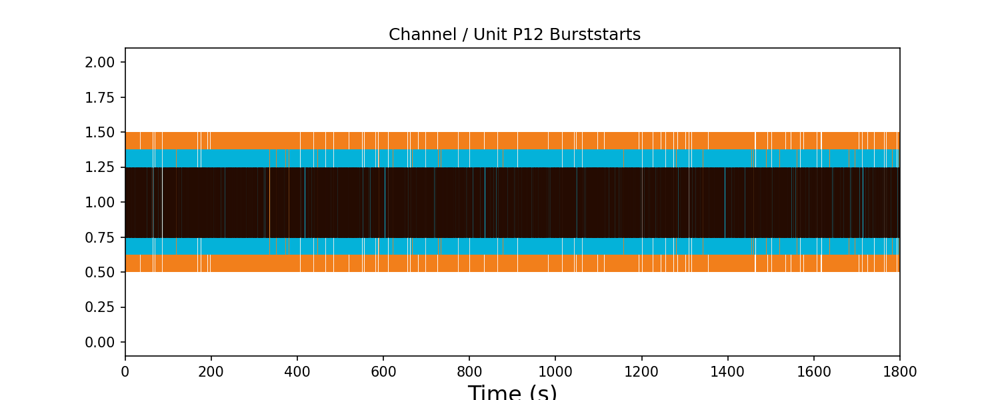

<IPython.core.display.Javascript object>


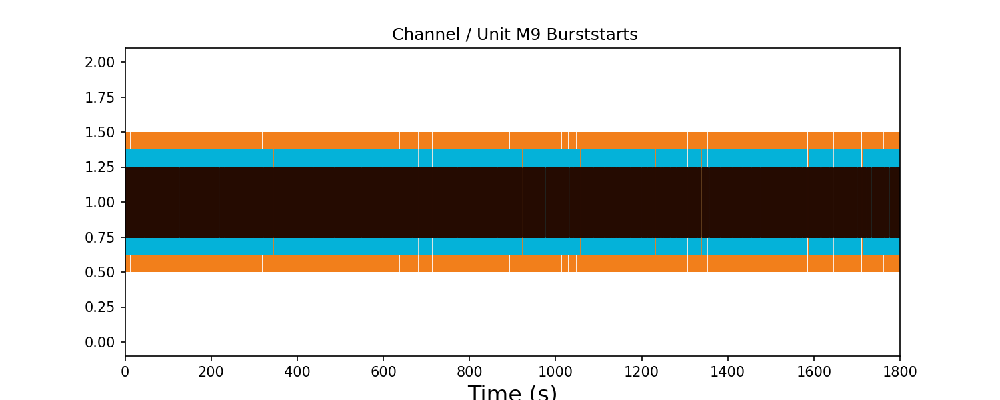

<IPython.core.display.Javascript object>


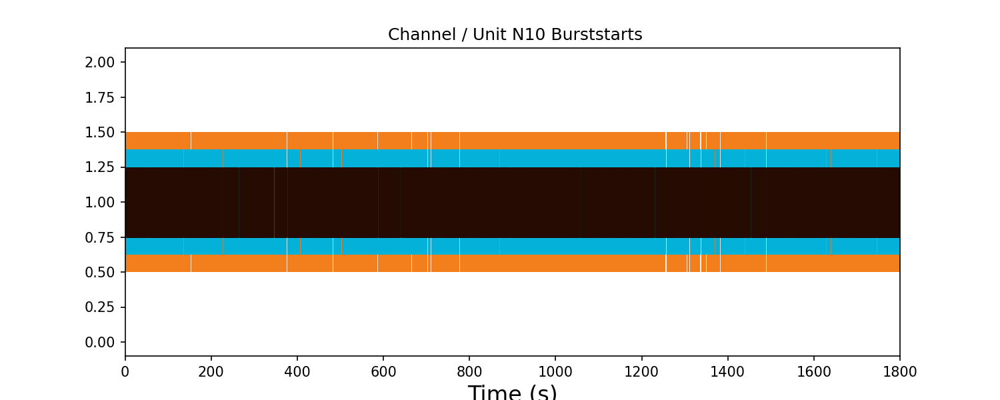

<IPython.core.display.Javascript object>


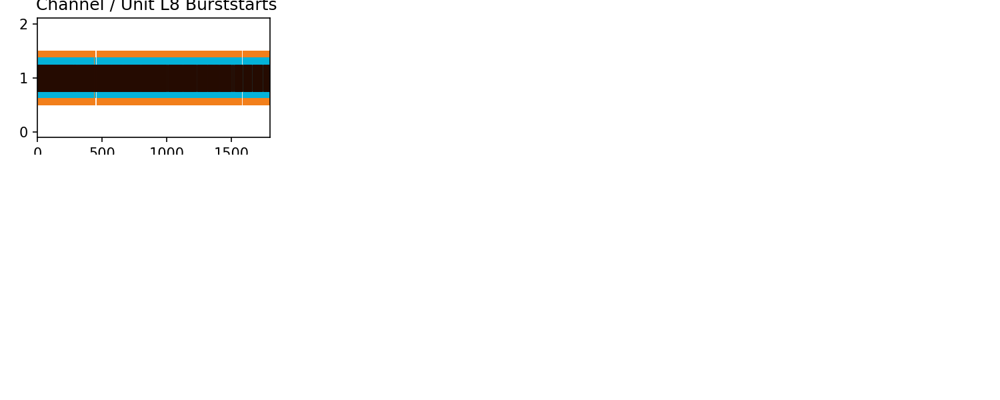

<IPython.core.display.Javascript object>


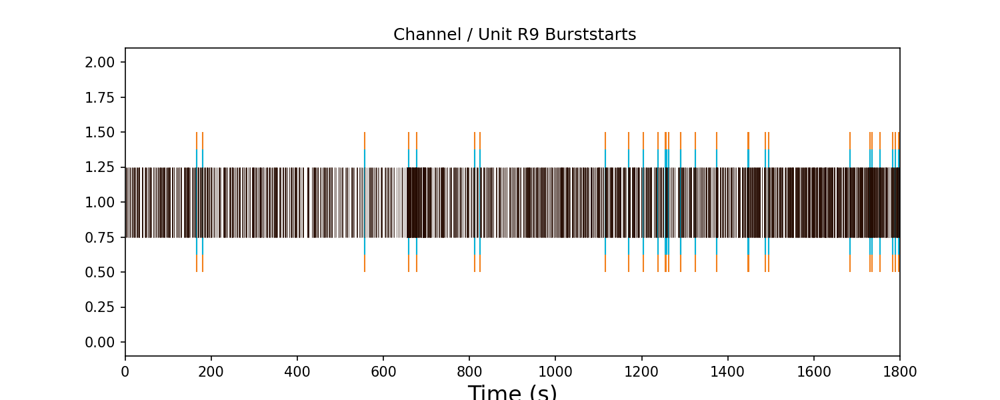

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


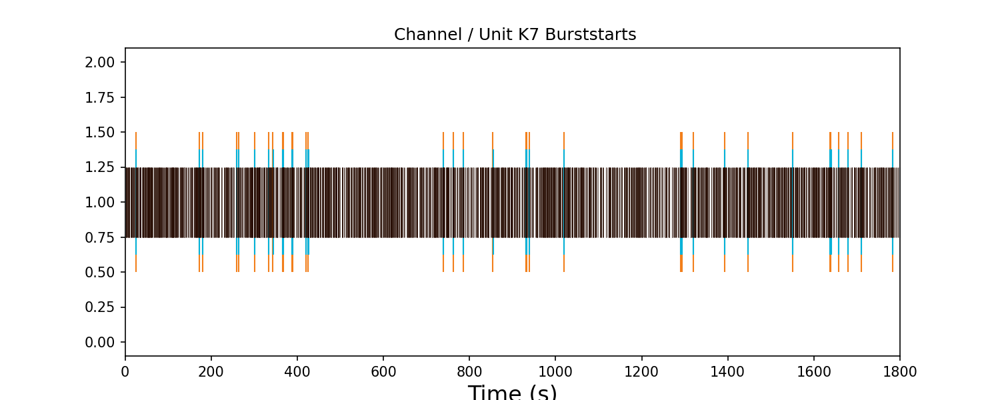

<IPython.core.display.Javascript object>


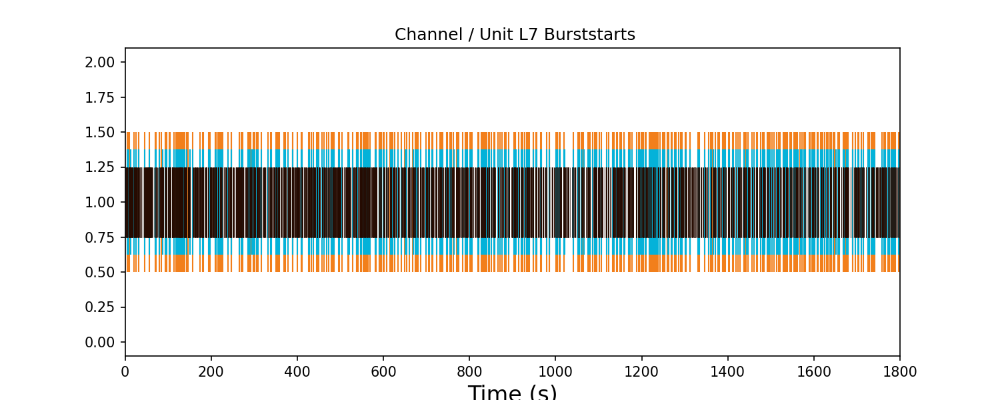

<IPython.core.display.Javascript object>


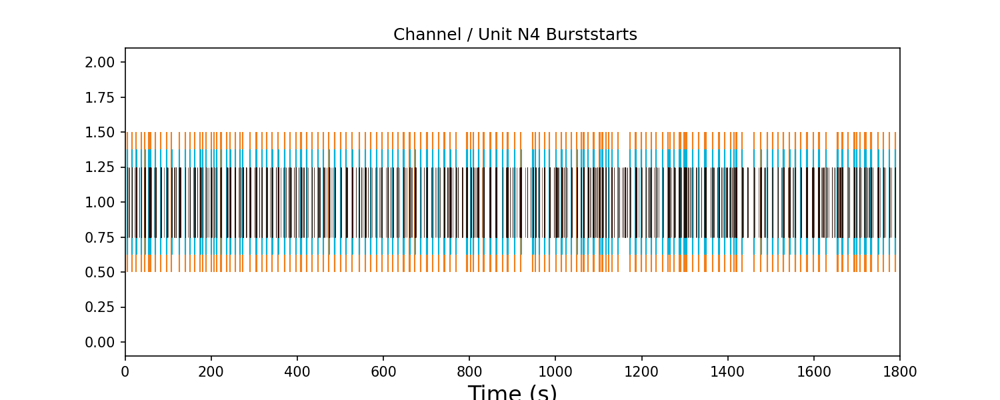

<IPython.core.display.Javascript object>


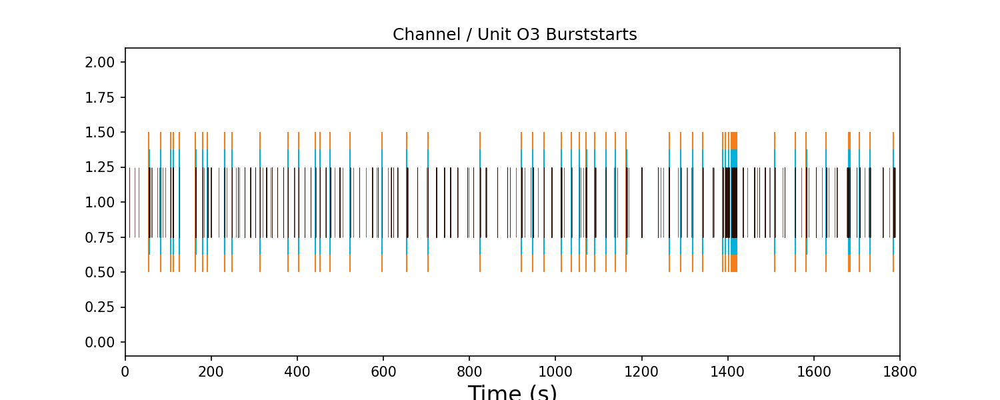

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


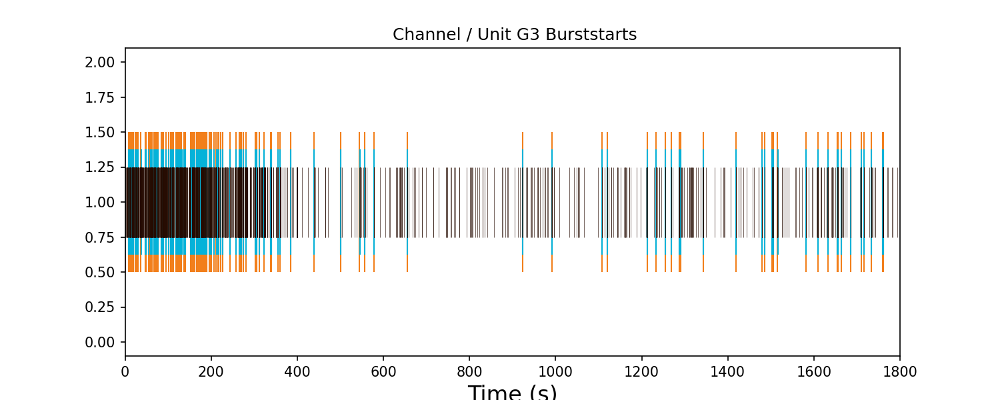

<IPython.core.display.Javascript object>


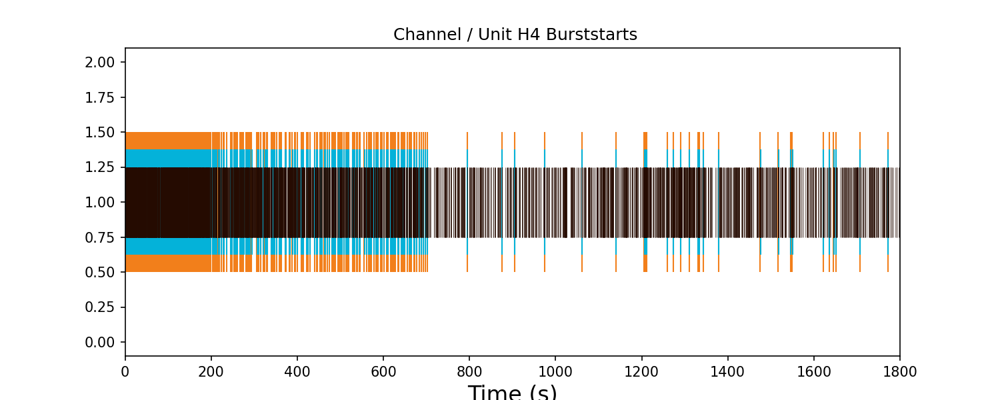

<IPython.core.display.Javascript object>


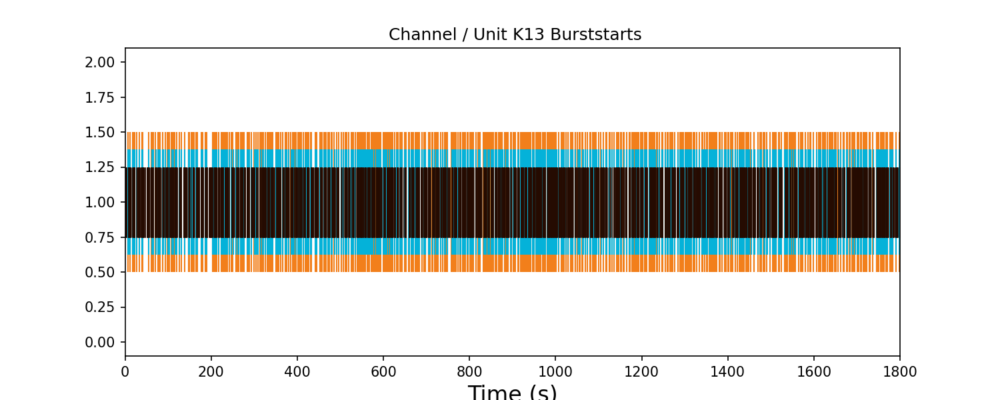

<IPython.core.display.Javascript object>


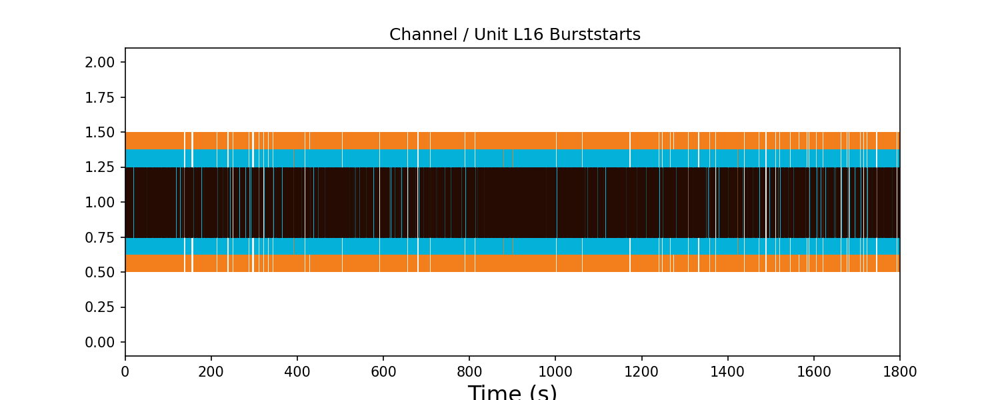

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


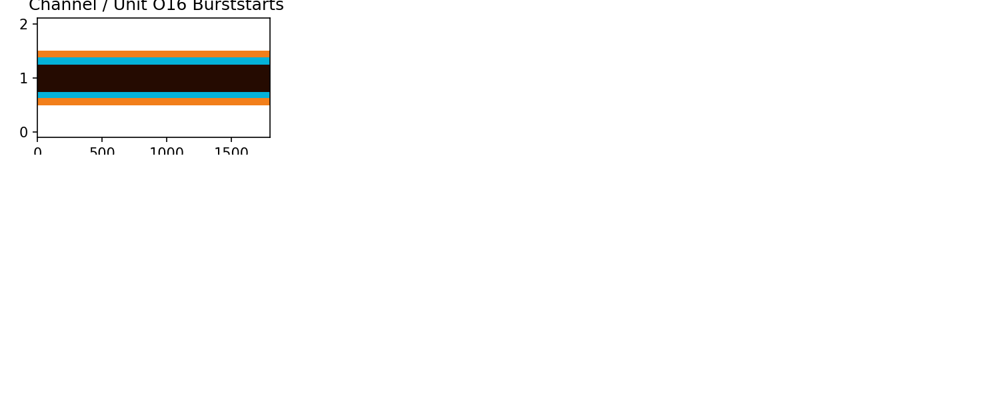

<IPython.core.display.Javascript object>


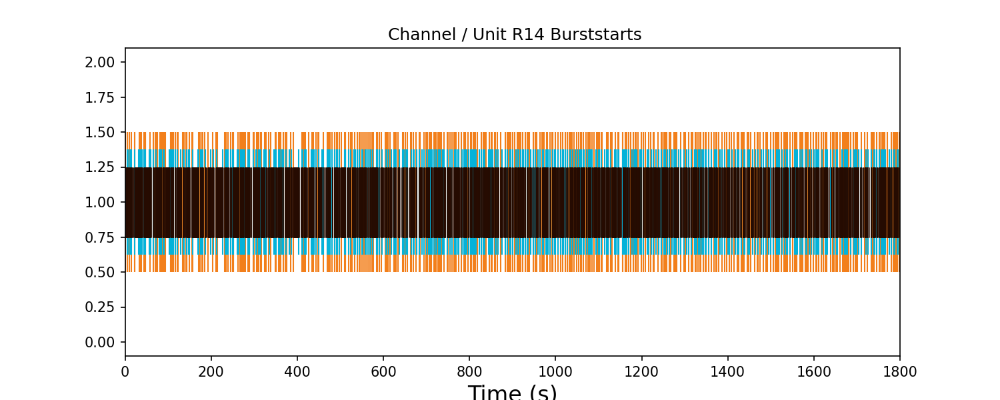

<IPython.core.display.Javascript object>


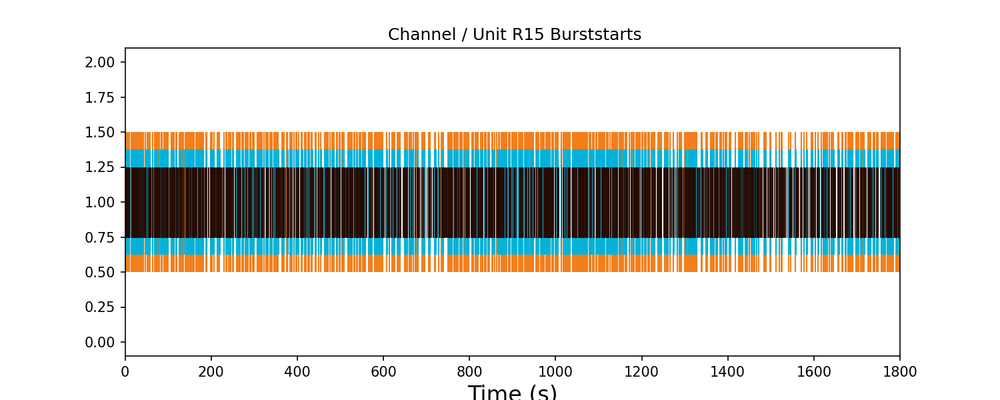

<IPython.core.display.Javascript object>


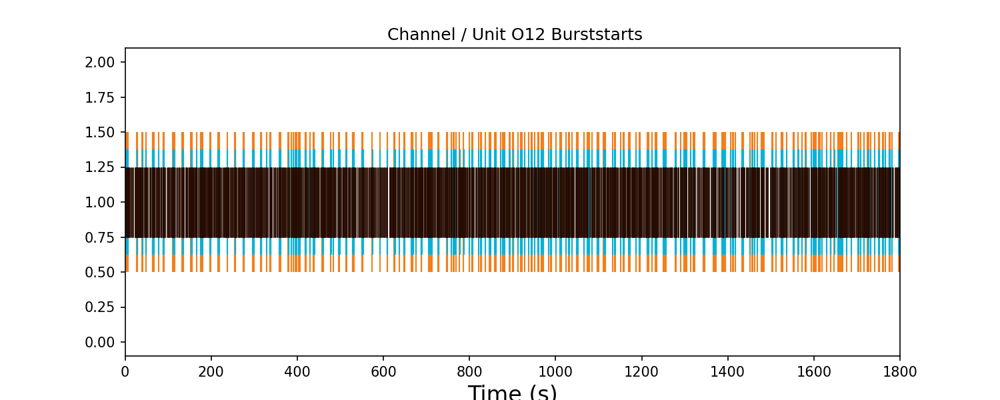

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


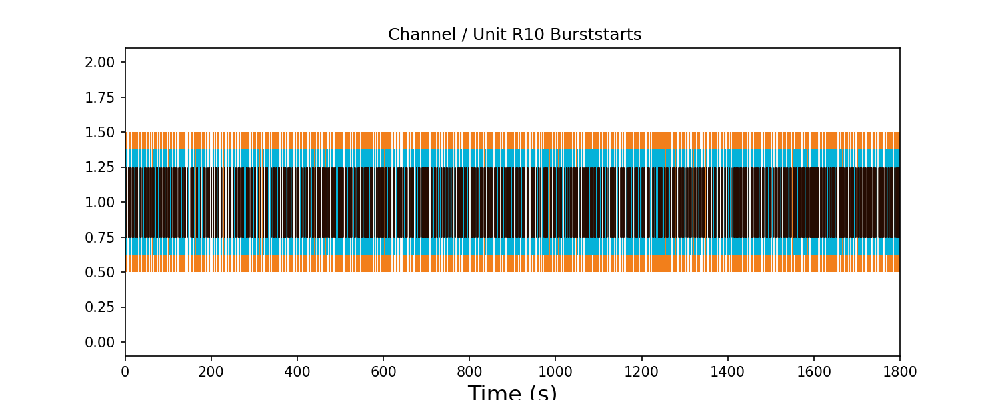

<IPython.core.display.Javascript object>


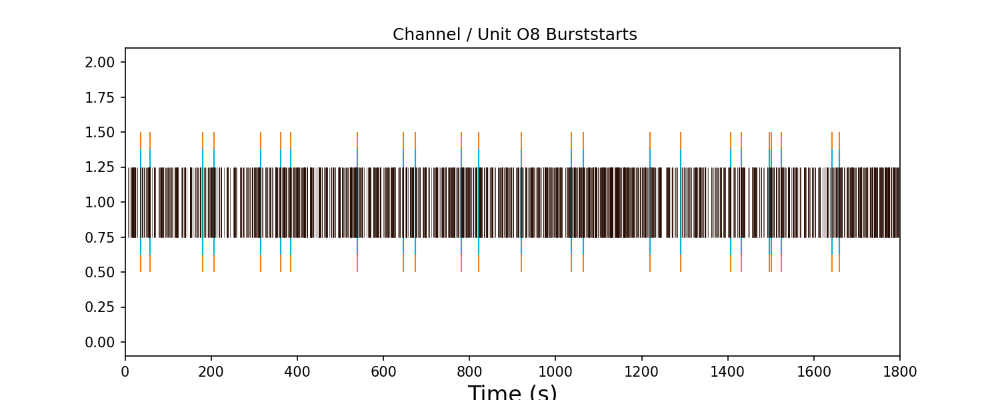

<IPython.core.display.Javascript object>


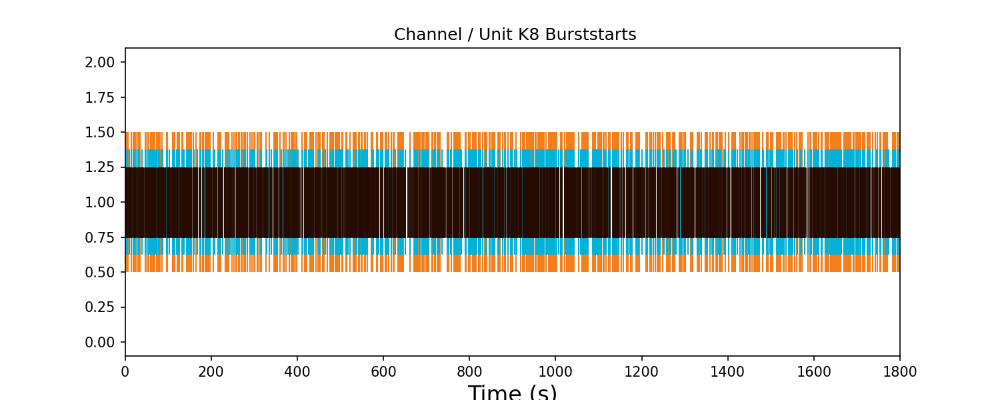

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


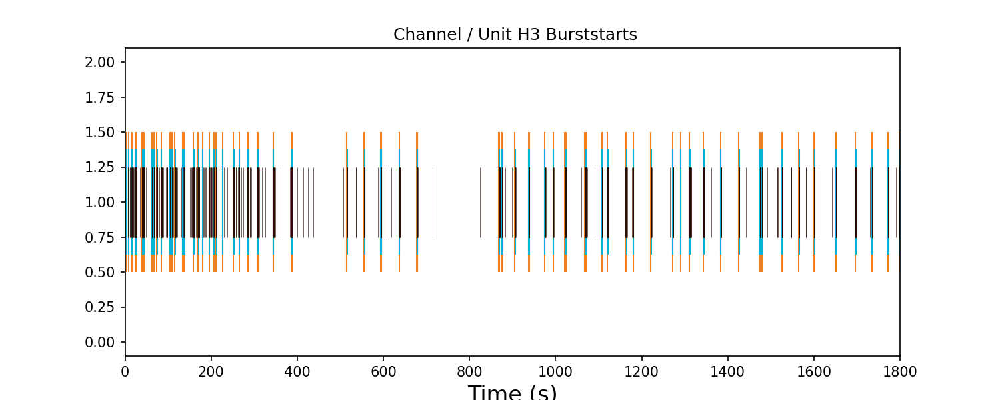

<IPython.core.display.Javascript object>


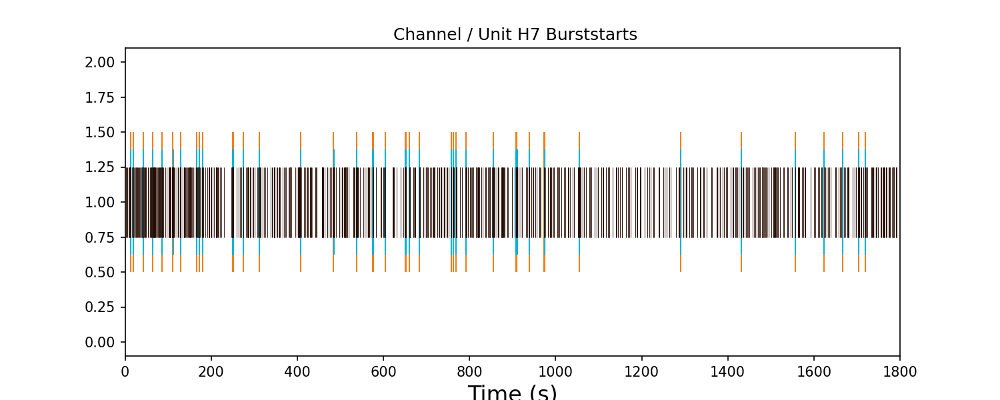

<IPython.core.display.Javascript object>


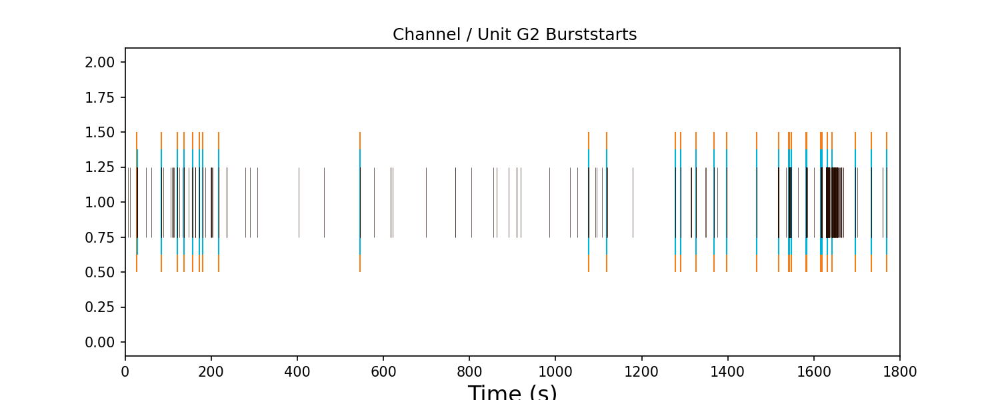

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


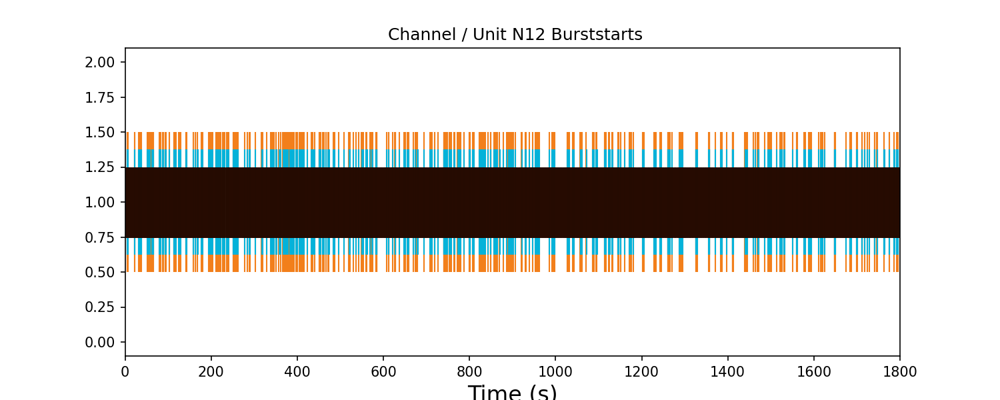

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


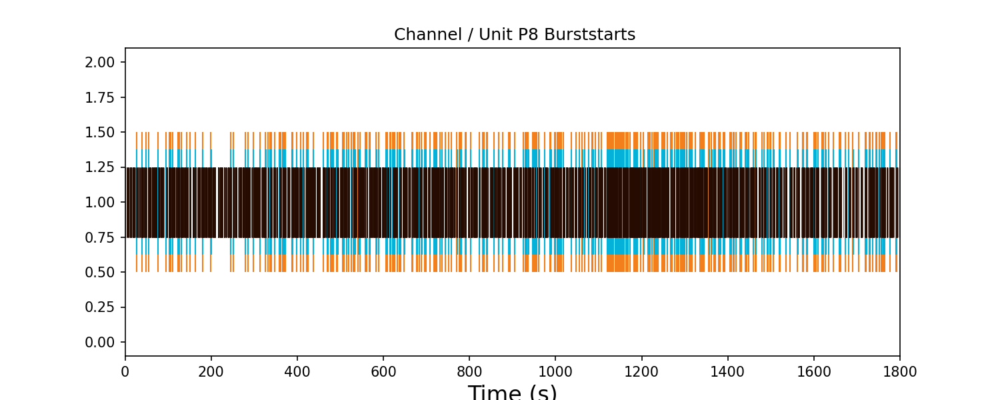

<IPython.core.display.Javascript object>


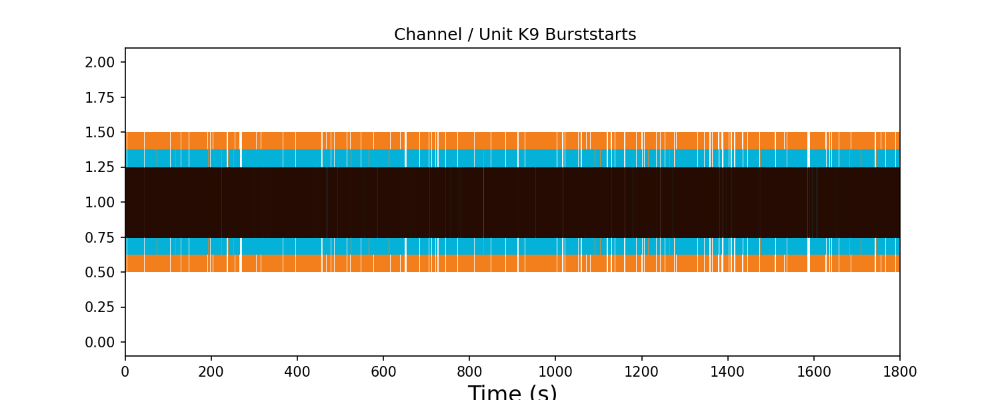

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


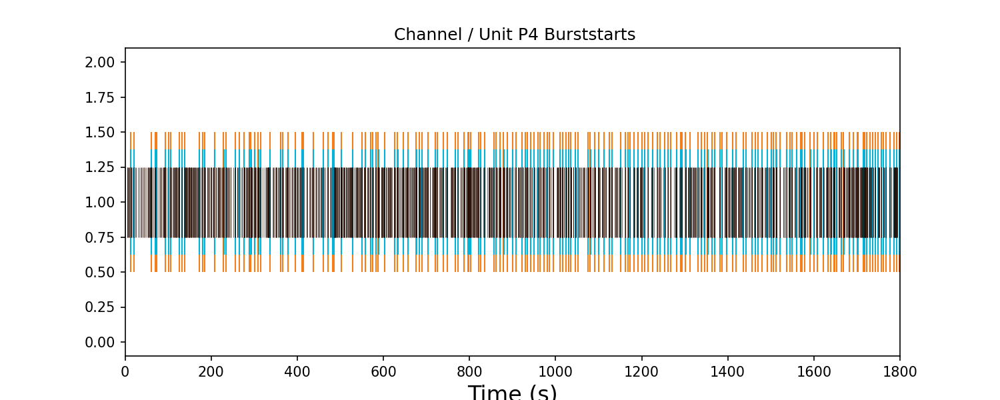

<IPython.core.display.Javascript object>


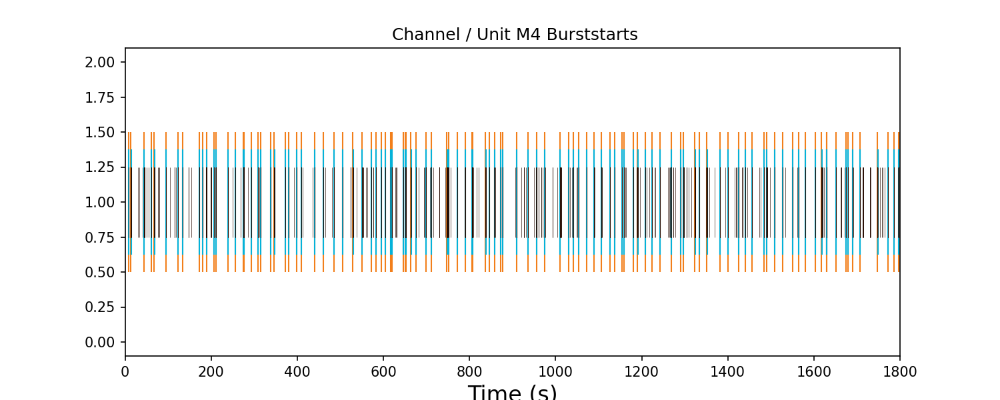

<IPython.core.display.Javascript object>


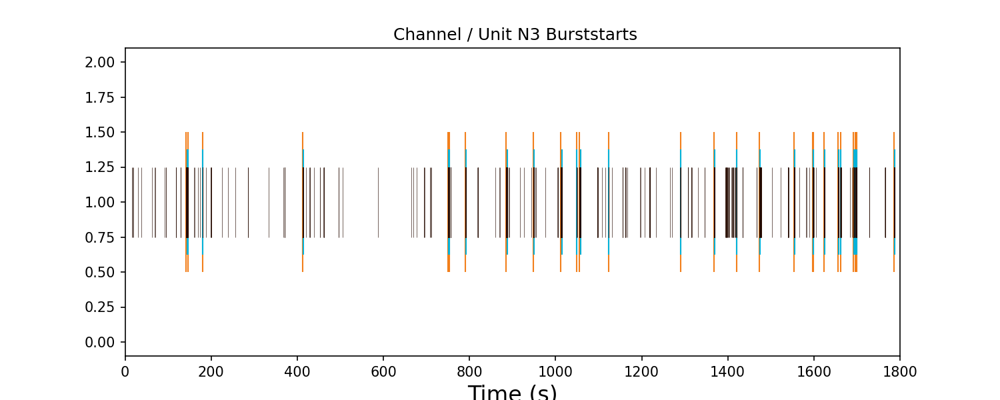

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


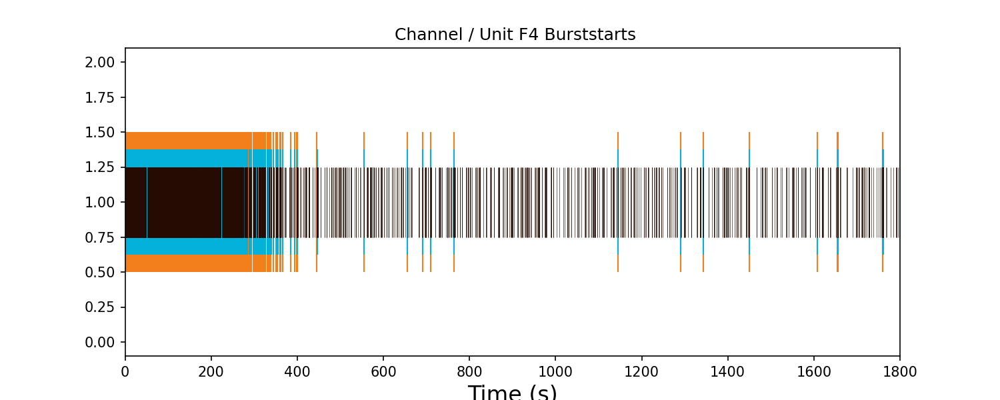

<IPython.core.display.Javascript object>


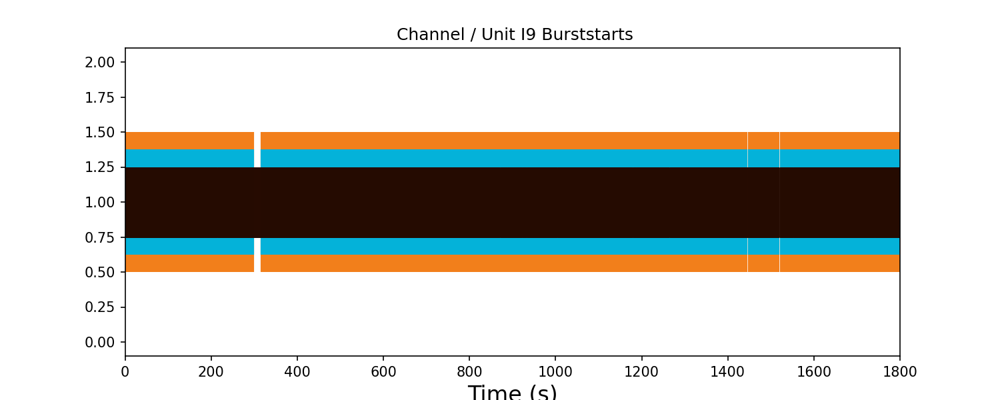

<IPython.core.display.Javascript object>


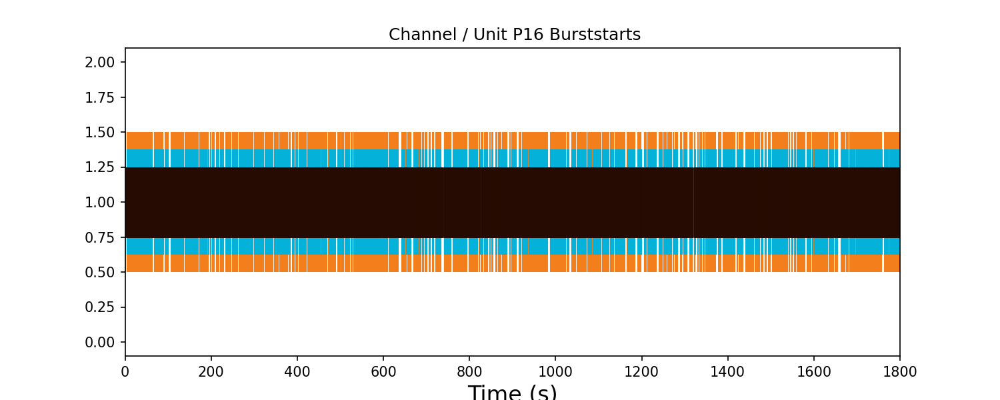

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


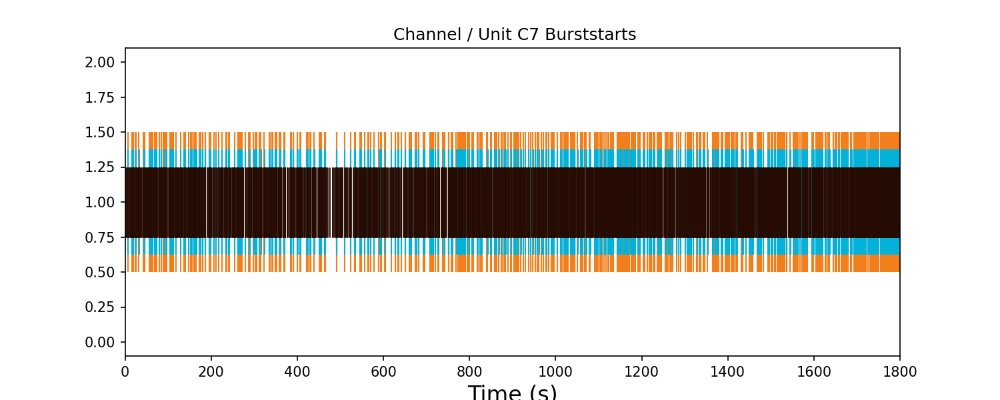

<IPython.core.display.Javascript object>


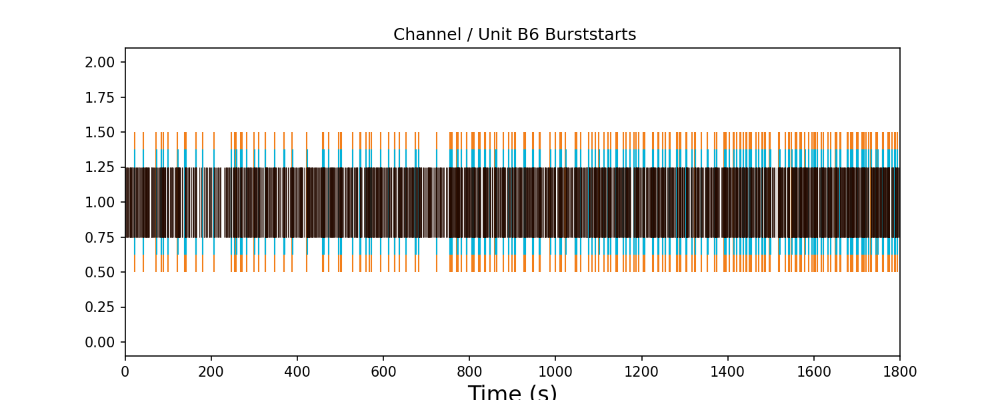

<IPython.core.display.Javascript object>


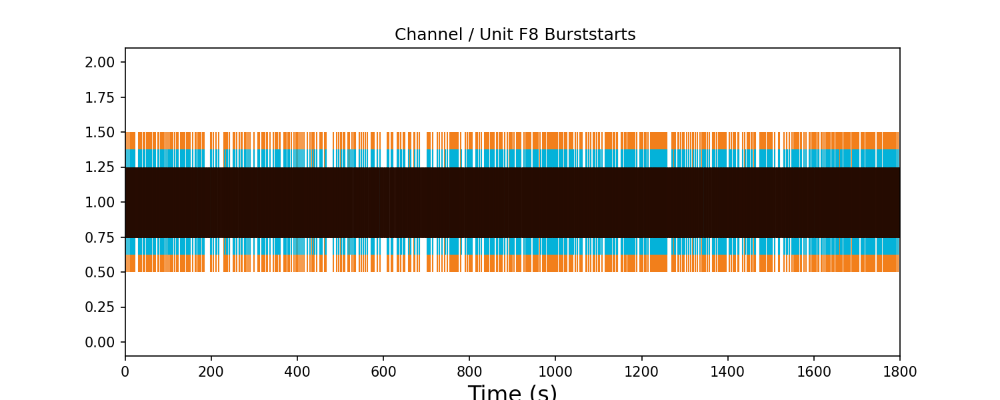

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


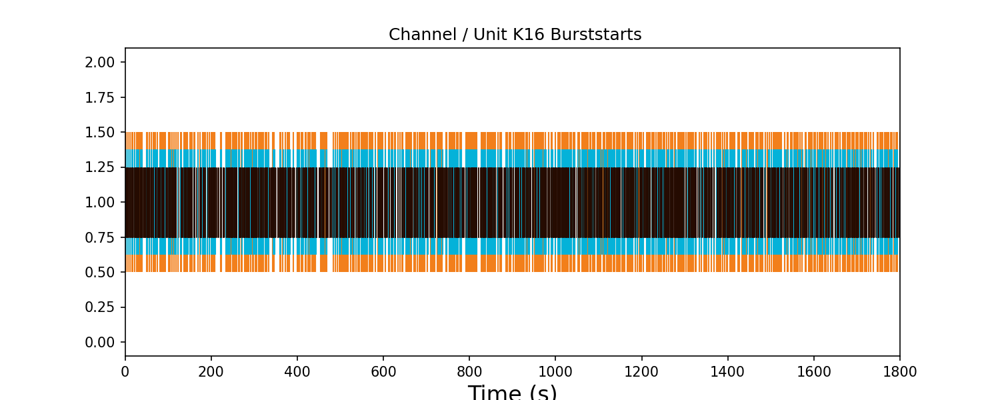

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>


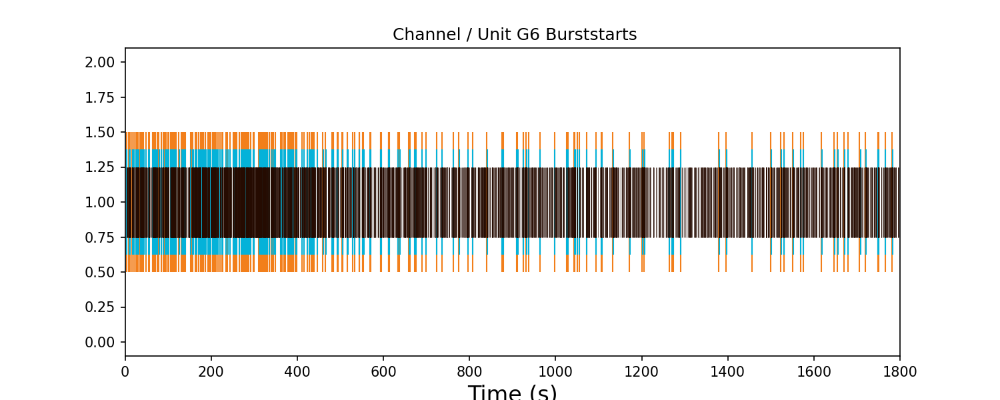

<IPython.core.display.Javascript object>


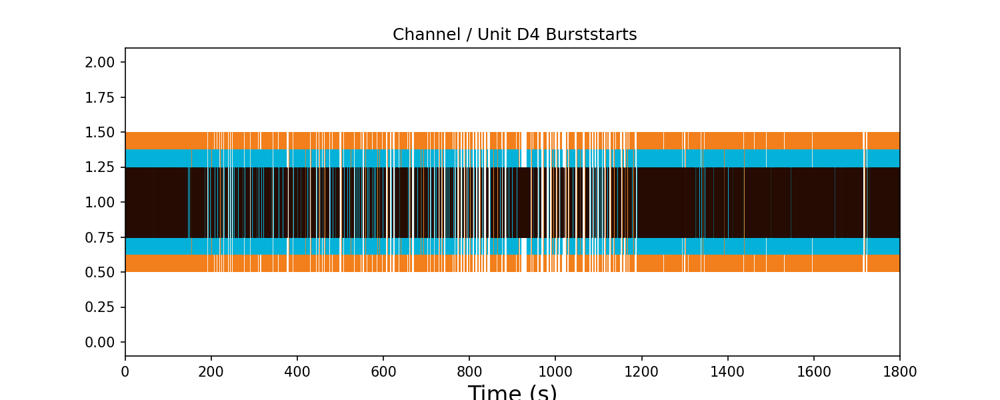

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


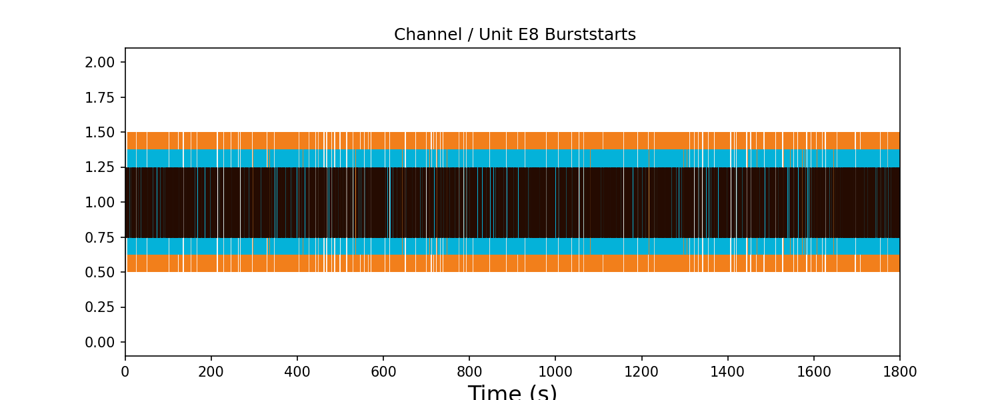

<IPython.core.display.Javascript object>


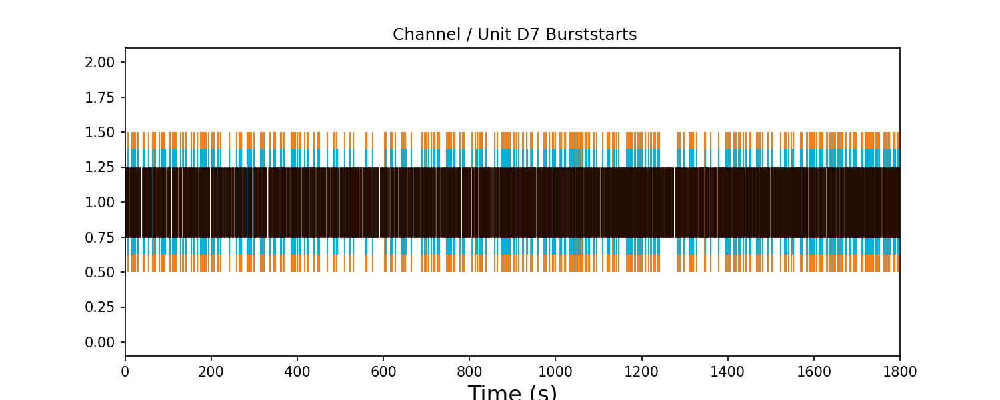

<IPython.core.display.Javascript object>


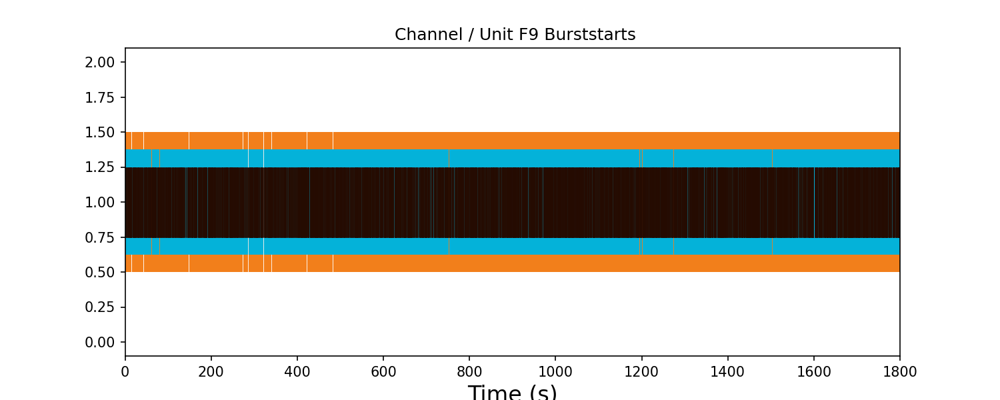

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


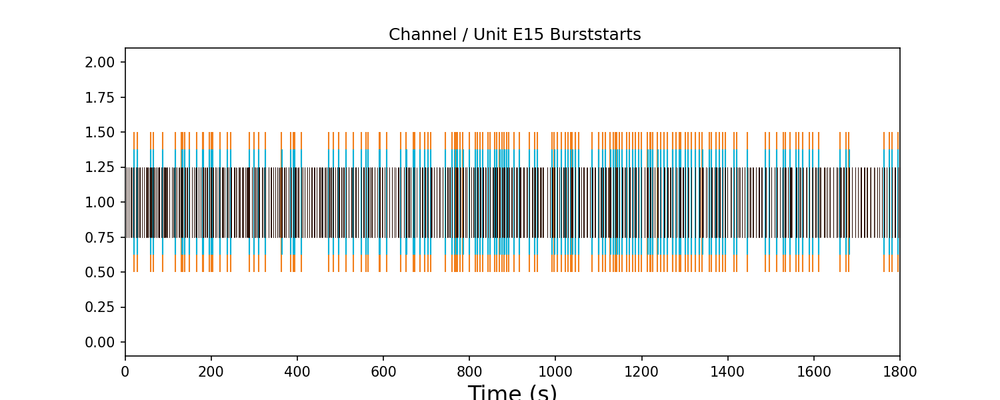

<IPython.core.display.Javascript object>


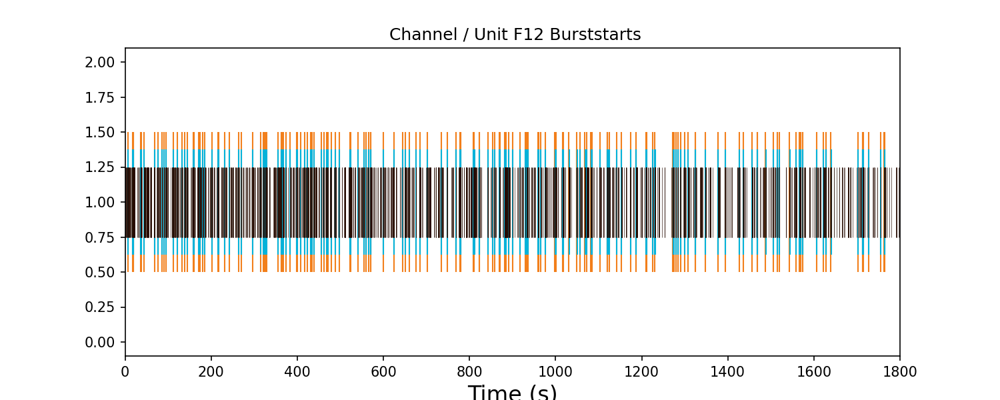

<IPython.core.display.Javascript object>


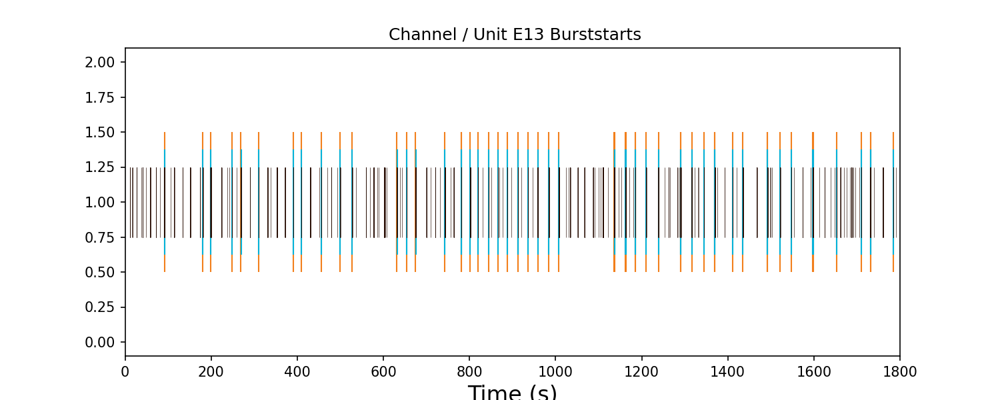

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


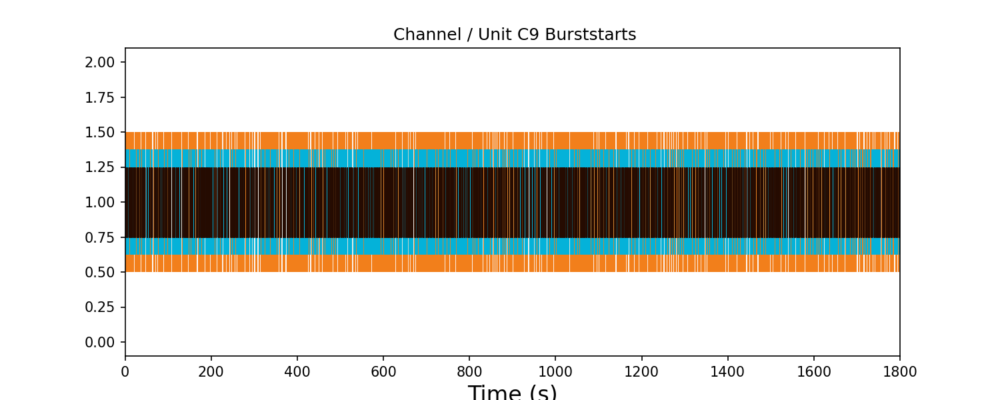

<IPython.core.display.Javascript object>


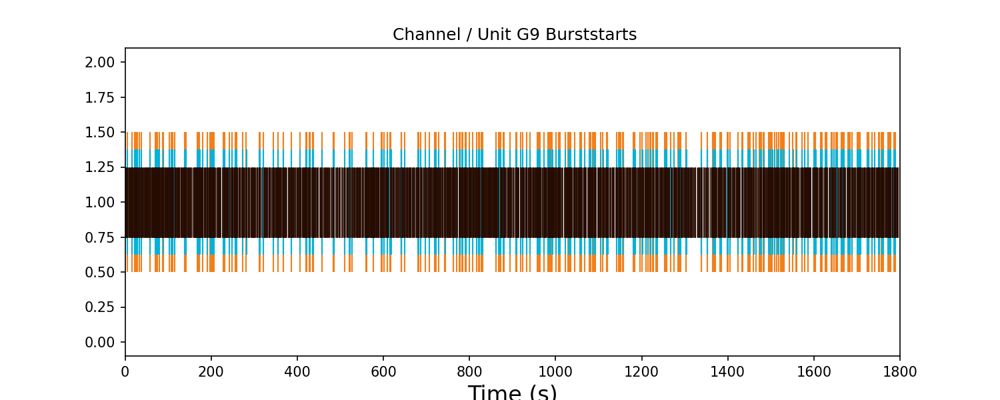

<IPython.core.display.Javascript object>


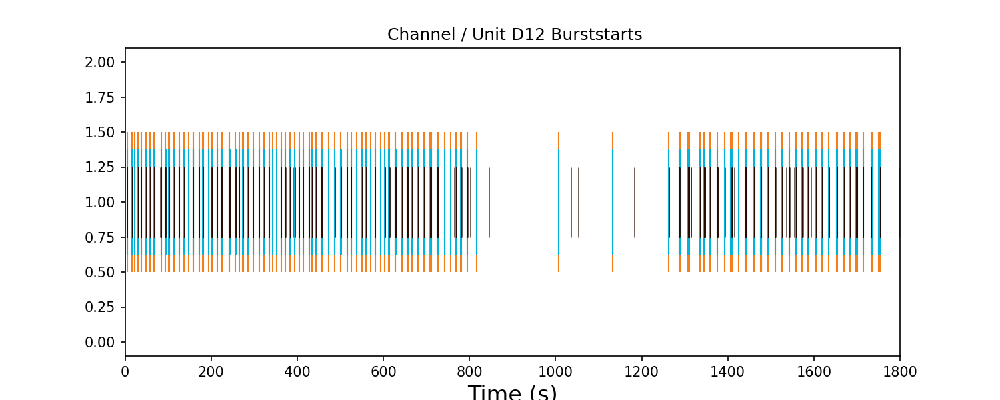

<IPython.core.display.Javascript object>


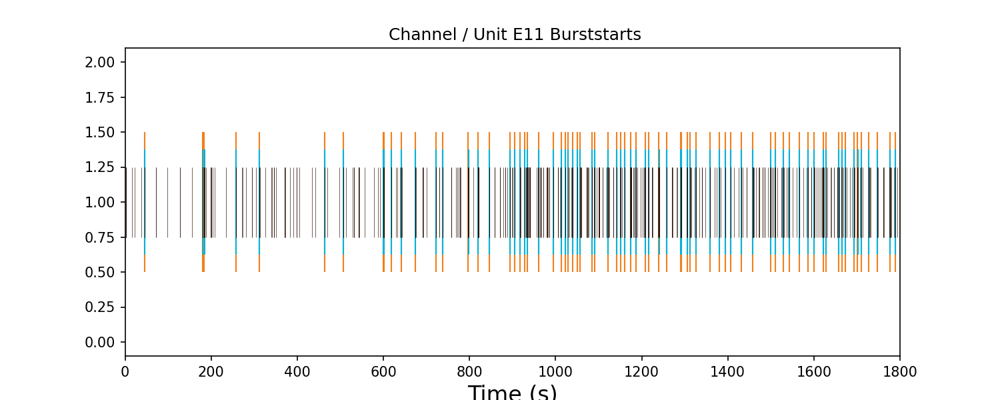

<IPython.core.display.Javascript object>


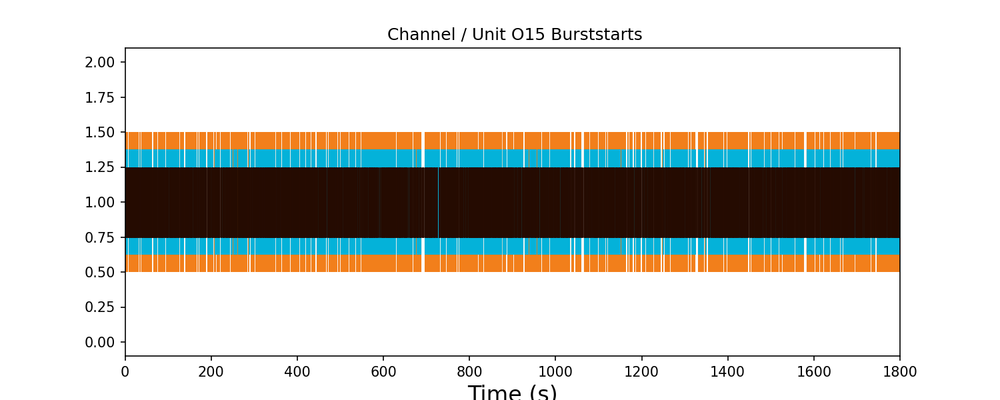

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


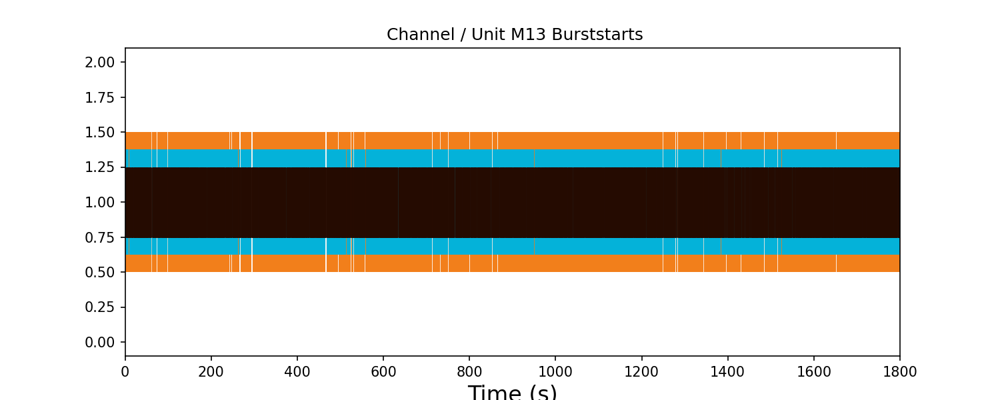

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


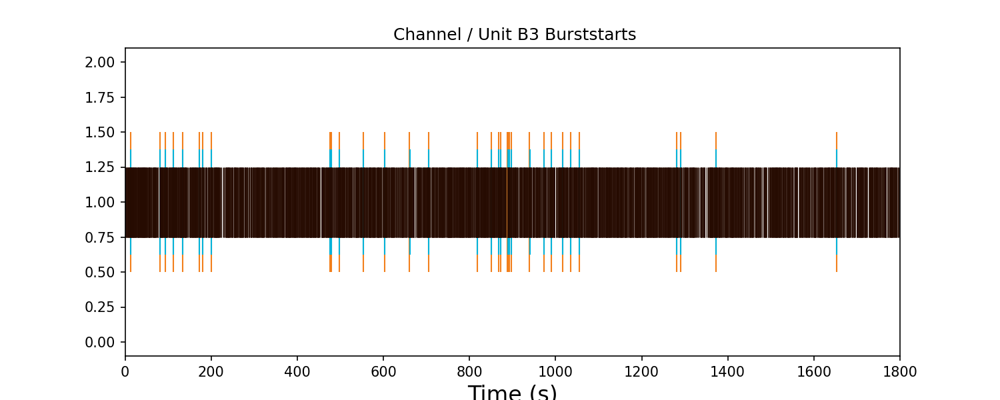

<IPython.core.display.Javascript object>


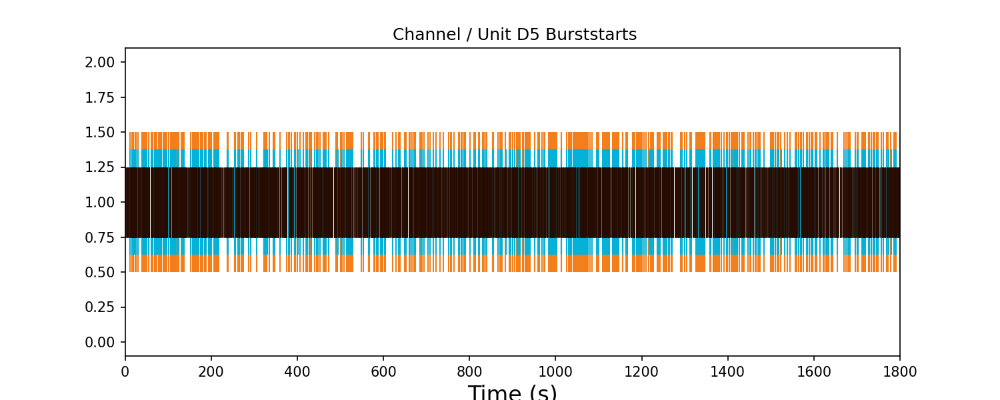

<IPython.core.display.Javascript object>


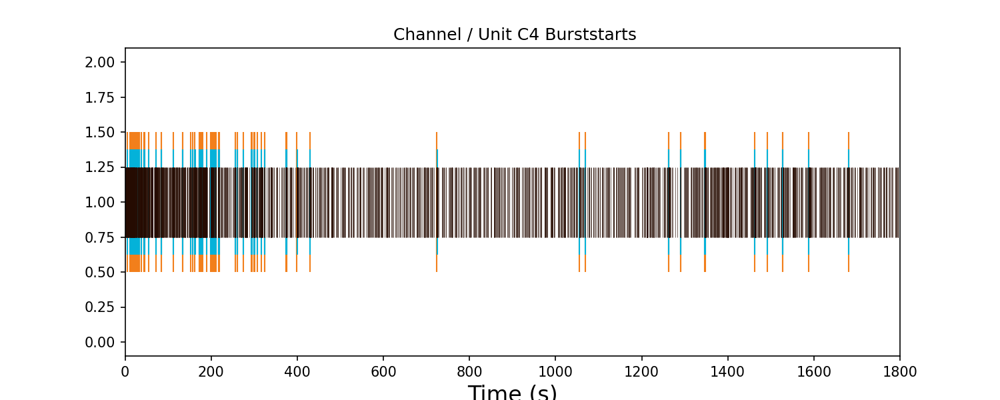

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>


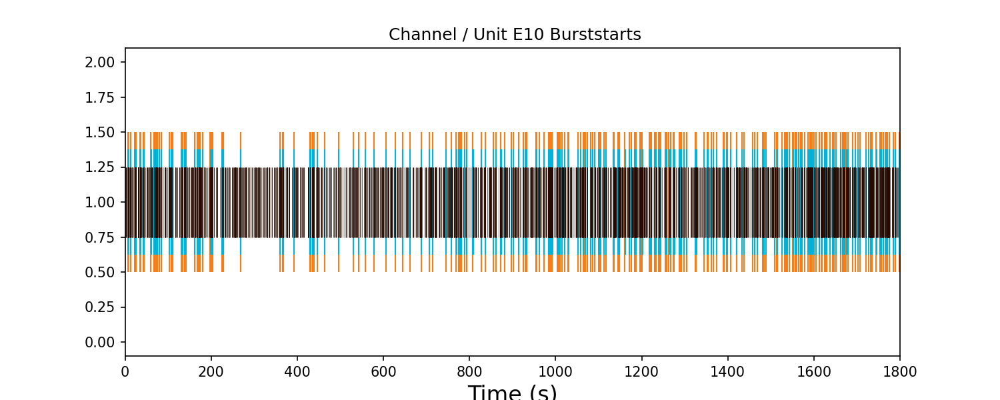

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>

In [59]:
st_neurons = st_channel
for key in burststart_end_dic:
    burststarts_array = []
    burstend_array = []
    for i in range(0, len(burststart_end_dic[key])):
        start = burststart_end_dic[key][i][0]*scale_factor_for_second
        end = burststart_end_dic[key][i][1]*scale_factor_for_second
        burststarts_array.append(start)
        burstend_array.append(end)

    array = np.array(st_neurons[key]).flatten()*40*scale_factor_for_second
    #burststarts = np.array(burststartdic[key]).flatten()*scale_factor_for_second
    
    #if len(array) > 20:
    if len(burststarts_array) > 20:
        fig = plt.figure(figsize=(10, 4))
        ax = fig.add_subplot(1, 1, 1)
        ax.eventplot(burststarts_array, linelengths = 1, linewidth = 1, color='#F27F1B')
        ax.eventplot(burstend_array, linelengths = 0.75, linewidth = 1, color='#04B2D9')
        ax.eventplot(array, linelengths= 0.5, linewidth = 0.3, color='#260B01')
        #ax.eventplot(trigger_on_seconds, linelengths=0.75, color='blue')
        ax.set_xlabel('Time (s)', fontsize=16)
        ax.set_title(' Channel / Unit '+str(key) +' Burststarts')
        ax.set_xlim(0, timelengthrecording_s)
        #ax.set_ylabel('Channel % - Eventplot with burststarts' %str(key))
        #ax.set_ylabel('Channel '+str(key) +' Burststarts')


        plt.show()
        #fig.savefig(str(filename) +'_burstplot_'+str(key)+'.png')
        #plt.close()

In [60]:
# for every unit, the whole time of bursts is calculated and put into a dictionary
bursting_time_per_unit_dic = {}
for key in burststart_end_dic:
    time = 0
    for i in burststart_end_dic[key]:
        bursttime = i[1] - i[0]
        time = time + bursttime
    bursting_time_per_unit_dic[key] = time*scale_factor_for_second # kein tick, vorher bereits drin

In [61]:
# for every unit, the whole time of bursts is calculated and put into a dictionary
bursts_per_unit_dic = {}
for key in burststart_end_dic:
    number_of_bursts = 0
    for i in burststart_end_dic[key]:
        number_of_bursts += 1
    bursts_per_unit_dic[key] = number_of_bursts

In [62]:
bursting_time_per_unit_dic

In [63]:
# this function takes the dictionary with every burst start and stop and returns a dictionary
# where every unit is a key and the values are tuples consisting of keys of connected units (i.e., bursting together)
# and the number of shared bursts


burst_connections_dic = {}


for key in burststart_end_dic:
    other_keys = list(burststart_end_dic.keys())
    other_keys.remove(key)
    connected_unit_list = []
    for j in other_keys:
        number_of_bursts = 0
        time_shared = 0
        for i in burststart_end_dic[key]:
            start, end = i[0], i[1]
            for m in burststart_end_dic[j]:
                other_start = m[0]
                other_end = m[1]
                if (other_start > start) & (other_start < end):
                    if other_end >= end:
                        time_shared = time_shared + (end - other_start)
                    else:
                        time_shared = time_shared + (other_end - other_start)
                    number_of_bursts += 1
                    
        if number_of_bursts > 0:
            connected_unit_list.append((j, number_of_bursts, time_shared*scale_factor_for_second))        
    burst_connections_dic[key] = connected_unit_list

In [64]:
np.save(filename+'_whole_recording_burst_connections_dic.npy', burst_connections_dic)

In [65]:
burst_connections_dic = np.load(filename+'_whole_recording_burst_connections_dic.npy', allow_pickle = True).item()

In [66]:
simple_burst_connection = {}

for key in burst_connections_dic:
    listed_connections = []
    for i in burst_connections_dic[key]:
        if i[1] > 10: # anzahl der geshareten bursts
        #if i[2] > 3: # Länge der gesharedten bursts in sec
        #if (i[1] > 10) & (i[2] > 1): # Länge der gesharedten bursts in sec
            listed_connections.append(i[0])
    simple_burst_connection[key] = listed_connections

In [67]:
simple_burst_connection

{'R12': ['L10',
  'O10',
  'P11',
  'L9',
  'N9',
  'M8',
  'R8',
  'O6',
  'N7',
  'R4',
  'K6',
  'I8',
  'M1',
  'H5',
  'F3',
  'N13',
  'O14',
  'R13',
  'L11',
  'O11',
  'P12',
  'M9',
  'N10',
  'L8',
  'O7',
  'N8',
  'P6',
  'L7',
  'N4',
  'N1',
  'L6',
  'L3',
  'M2',
  'G3',
  'H4',
  'K13',
  'L16',
  'I12',
  'K15',
  'I14',
  'K10',
  'O16',
  'R14',
  'R15',
  'O12',
  'P13',
  'M10',
  'N11',
  'R10',
  'K8',
  'M6',
  'O4',
  'K5',
  'H3',
  'E4',
  'F5',
  'P14',
  'N12',
  'O13',
  'R11',
  'M11',
  'O9',
  'P8',
  'K9',
  'M7',
  'R7',
  'N6',
  'L5',
  'K2',
  'I7',
  'G5',
  'F4',
  'I9',
  'P16',
  'H8',
  'A5',
  'F7',
  'C7',
  'B6',
  'F8',
  'D8',
  'E9',
  'K16',
  'I15',
  'I13',
  'H10',
  'I11',
  'H14',
  'H12',
  'G6',
  'D4',
  'A4',
  'F6',
  'B5',
  'E8',
  'D7',
  'F9',
  'A8',
  'D9',
  'G10',
  'G13',
  'E15',
  'F12',
  'F11',
  'H11',
  'I10',
  'H13',
  'G12',
  'D3',
  'C5',
  'B4',
  'E7',
  'D6',
  'B8',
  'A7',
  'C9',
  'G9',
  'D12',
  

In [68]:
# Reutlingen
all_channels = ['D1', 'E1', 'F1', 'G1', 'H1', 'I1', 'I2', 'K1', 'K2', 'L1', 'L2', 'L3', 'M1', 'M2', 
                        'M3', 'M4', 'N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'O1', 'O2', 'O3', 'O4', 'O5', 'O6', 
                        'O7', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'R2', 'R3', 'R4', 'R5', 
                        'R6', 'R7', 'R8', 'R9', 'R10', 'R11', 'R12', 'R13', 'R14', 'R15', 'B1', 'B2', 'C1', 'C2', 'D2', 'E2', 'F2', 'G2', 'G3', 'H2', 'H3', 'I3', 'K3', 'K4', 
                         'L4', 'L5', 'M5', 'M6', 'M7', 'N7', 'N8', 'O8', 'O9', 'O10', 'O11', 'P10', 'P11', 
                         'P12', 'P13', 'P14', 'P15', 'P16', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'A11', 'B3', 'B4', 'B5', 'B6', 
                         'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 
                          'C11', 'C12', 'C13', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 
                         'D13', 'D14', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'E13', 'E14', 
                         'E15', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 
                         'F16', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15', 'G16', 
                         'H4', 'H5', 'H6', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12', 'H13', 'H14', 'H15', 'H16', 'I4', 
                         'I5', 'I6', 'I7', 'I8', 'I9', 'I10', 'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'K5', 'K6', 
                         'K7', 'K8', 'K9', 'K10', 'K11', 'K12', 'K13', 'K14', 'K15', 'K16', 'L6', 'L7', 'L8', 'L9', 
                         'L10', 'L11', 'L12', 'L13', 'L14', 'L15', 'L16', 'M8', 'M9', 'M10', 'M11', 'M12', 'M13', 
                         'M14', 'M15', 'M16', 'N9', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'O12', 'O13', 
                         'O14', 'O15', 'O16', 'A12', 'A13', 'A14', 'A15', 'B13', 'B14', 'B15', 'B16', 'C14', 'C15', 'C16', 'D15', 'D16', 'E16']

In [69]:
#layerdic 16.04.2019 B!!!
layerdic = {'layer1':[], 
            'layer2-3': ['F1', 'G1', 'H1', 'I1', 'K1', 'L1', 'M1', 'N1', 'O1', 'P1', 'H2', 'I2', 'K2', 'L2', 
                         'M2', 'N2', 'O2', 'P2', 'R2', 'K3', 'L3', 'M3', 'N3', 'O3', 'P3', 'R3', 'L4', 'M4', 
                         'N4', 'O4', 'P4', 'R4', 'N5', 'O5', 'P5', 'R5', 'P6', 'R6', 'R7'],
           'layer4':    ['D1', 'E1', 'F2', 'G2', 'G3', 'H3', 'I3', 'I4', 'K4', 'L5', 'M5', 'M6', 'N6', 'O6', 
                         'O7', 'P7', 'P8', 'R8'],
                         
           'layer5-6':  ['B1', 'C1', 'A2', 'B2', 'C2', 'D2', 'E2', 'A3', 'B3', 'C3', 'D3', 'E3', 'F3',
                         'A4', 'B4', 'C4', 'D4', 'E4', 'F4', 'G4', 'H4', 'A5', 'B5', 'C5', 'D5', 'E5', 
                         'F5', 'G5', 'H5', 'I5', 'K5', 'A6', 'B6', 'C6', 'D6', 'E6', 'F6', 'G6', 'H6', 'I6', 
                         'K6', 'L6', 'A7', 'B7', 'C7', 'D7', 'E7', 'F7', 'G7', 'H7', 'I7', 'K7', 'L7', 'M7', 
                         'N7', 'A8', 'B8', 'C8', 'D8', 'E8', 'F8', 'G8', 'H8', 'I8', 'K8', 'L8', 'M8', 
                         'N8', 'O8', 'B9', 'C9', 'D9', 'E9', 'F9', 'G9', 'H9', 'I9', 'K9', 'L9', 'M9', 
                         'N9', 'O9', 'P9', 'R9', 'C10', 'D10', 'E10', 'F10', 'G10', 'H10', 'I10', 'K10', 
                         'L10', 'M10', 'N10', 'O10', 'P10', 'R10', 'D11', 'E11', 'F11', 'G11', 'H11', 
                         'I11', 'K11', 'L11', 'M11', 'N11', 'O11', 'P11', 'R11', 'E12', 'F12', 'G12', 
                         'H12', 'I12', 'K12', 'L12', 'M12', 'N12', 'O12', 'P12', 'R12', 'F13', 'G13', 
                         'H13', 'I13', 'K13', 'L13', 'M13', 'N13', 'O13', 'P13', 'R13', 'G14', 'H14', 
                         'I14', 'K14', 'L14', 'M14', 'N14', 'O14', 'P14', 'R14', 'H15', 'I15', 'K15', 
                         'L15', 'M15', 'N15', 'O15', 'P15', 'R15', 'I16', 'K16', 'L16', 'M16', 
                         'N16', 'O16', 'P16', 'R16'],
           'whitematter':['A9', 'A10', 'B10', 'A11', 'B11', 'C11', 'A12', 'B12', 'C12', 'D12', 'A13', 
                          'B13', 'C13', 'D13', 'E13', 'A14', 'B14', 'C14', 'D14', 'E14', 'F14', 'A15', 
                          'B15', 'C15', 'D15', 'E15', 'F15', 'G15', 'B16', 'C16', 'D16', 'E16', 'F16', 
                          'G16', 'H16']
                         }

In [70]:
def invert_layerdic(layer_dic):
    
    '''
    Expects a dictionary with key = layer, value = list of channellabels
    
    Returns a dictionary with key = channellabels, value = layer
    '''
    layerdic_invert = {}

    for key in layerdic:
        for i in layerdic[key]:
            layerdic_invert[i]=key
            
            
    return layerdic_invert

In [71]:
inverted_layerdic = invert_layerdic(layerdic)

In [72]:
inverted_layerdic['K5']

'layer5-6'

In [73]:
layer_colors={'layer1':'#F28749', 'layer2-3':'#B5D932', 'layer4':'#8C3A67', 'layer5-6':'#3F93A6', 'whitematter':'#C9F2EE'}

In [74]:
# this block creates coordinates as on a MEA Grid for each channel
# coordinates are between 0 and 1 via np.linspace

# CAVE: I needs to be exchanged for J for Aachen Data, or i.e. the not MC Rack obtained data
columnlist =['A','B','C','D','E','F','G','H','I','K','L','M','N','O','P','R']
mea_coordinates = np.linspace(0,1,16)
mea_positional_coordinates_dic = {}

for i in all_channels:
    x_num = columnlist.index(i[0])
    x_coord = mea_coordinates[x_num]
    y_num = 17-int(i[1:]) # minus 1 since python starts counting at zero
    y_coord = 1-(mea_coordinates[-y_num])
    mea_positional_coordinates_dic[i] = [x_coord, y_coord]

In [75]:
mea_coordinates

array([0.        , 0.06666667, 0.13333333, 0.2       , 0.26666667,
       0.33333333, 0.4       , 0.46666667, 0.53333333, 0.6       ,
       0.66666667, 0.73333333, 0.8       , 0.86666667, 0.93333333,
       1.        ])

In [76]:
burst_connections_dic

{'R12': [('L10', 70, 5.58544),
  ('O10', 60, 3.65312),
  ('P11', 122, 8.169),
  ('L9', 58, 4.079079999999999),
  ('N9', 37, 2.2936),
  ('M8', 166, 10.10252),
  ('R8', 27, 1.63556),
  ('O6', 63, 3.351),
  ('N7', 139, 7.96312),
  ('R4', 26, 1.2724),
  ('P5', 6, 0.21528),
  ('R2', 9, 0.34936),
  ('M5', 5, 0.15475999999999998),
  ('K6', 76, 5.27752),
  ('I8', 20, 1.2946),
  ('L2', 3, 0.11631999999999999),
  ('M1', 40, 3.32632),
  ('I4', 9, 0.49811999999999995),
  ('H1', 1, 0.01048),
  ('I6', 6, 0.1772),
  ('G4', 3, 0.12624),
  ('H5', 56, 4.72396),
  ('E2', 5, 0.27928),
  ('F3', 32, 2.6151999999999997),
  ('N13', 85, 5.62204),
  ('O14', 86, 6.34612),
  ('R13', 41, 2.77872),
  ('L11', 53, 3.22232),
  ('O11', 37, 2.6995999999999998),
  ('P12', 136, 10.234399999999999),
  ('M9', 150, 10.76136),
  ('N10', 165, 10.289159999999999),
  ('L8', 28, 2.33736),
  ('R9', 4, 0.23448),
  ('O7', 16, 0.86956),
  ('N8', 16, 0.8724),
  ('P6', 15, 1.09724),
  ('K7', 6, 0.51912),
  ('L7', 29, 1.58768),
  ('N4',

##### Simple Burst Connection

In [77]:
burst_conn_graph = nx.Graph()

In [78]:
for key in simple_burst_connection:
    for i in simple_burst_connection[key]:
        burst_conn_graph.add_edge(key, i)

In [79]:
burst_conn_graph.number_of_nodes(), burst_conn_graph.number_of_edges()

(192, 10913)

In [80]:
G = burst_conn_graph

In [81]:
G.nodes

NodeView(('R12', 'L10', 'O10', 'P11', 'L9', 'N9', 'M8', 'R8', 'O6', 'N7', 'R4', 'K6', 'I8', 'M1', 'H5', 'F3', 'N13', 'O14', 'R13', 'L11', 'O11', 'P12', 'M9', 'N10', 'L8', 'O7', 'N8', 'P6', 'L7', 'N4', 'N1', 'L6', 'L3', 'M2', 'G3', 'H4', 'K13', 'L16', 'I12', 'K15', 'I14', 'K10', 'O16', 'R14', 'R15', 'O12', 'P13', 'M10', 'N11', 'R10', 'K8', 'M6', 'O4', 'K5', 'H3', 'E4', 'F5', 'P14', 'N12', 'O13', 'R11', 'M11', 'O9', 'P8', 'K9', 'M7', 'R7', 'N6', 'L5', 'K2', 'I7', 'G5', 'F4', 'I9', 'P16', 'H8', 'A5', 'F7', 'C7', 'B6', 'F8', 'D8', 'E9', 'K16', 'I15', 'I13', 'H10', 'I11', 'H14', 'H12', 'G6', 'D4', 'A4', 'F6', 'B5', 'E8', 'D7', 'F9', 'A8', 'D9', 'G10', 'G13', 'E15', 'F12', 'F11', 'H11', 'I10', 'H13', 'G12', 'D3', 'C5', 'B4', 'E7', 'D6', 'B8', 'A7', 'C9', 'G9', 'D12', 'O15', 'H9', 'N14', 'M12', 'M13', 'N16', 'L12', 'L14', 'M15', 'D5', 'C4', 'A6', 'E6', 'C8', 'B7', 'G8', 'E10', 'D11', 'N15', 'G11', 'M14', 'K11', 'L13', 'M16', 'K12', 'E5', 'P5', 'R2', 'M5', 'L2', 'I4', 'I6', 'G4', 'E2', 'K7', '

### Complex Burst Graphs



we take for the nodesize the normalized amount of bursting time for each channel

we take for edges the number of shared bursts

In [82]:
bursting_time_per_unit_dic

{'R12': 152.31304,
 'L10': 671.0975599999999,
 'O10': 182.48275999999998,
 'P11': 368.36719999999997,
 'L9': 249.42911999999998,
 'N9': 107.14851999999999,
 'M8': 379.40407999999996,
 'R8': 87.81671999999999,
 'O6': 71.28988,
 'N7': 163.56144,
 'R4': 58.17292,
 'P5': 1.56696,
 'R2': 11.596079999999999,
 'M5': 14.07776,
 'K6': 296.17436,
 'I8': 20.67832,
 'L2': 3.5871999999999997,
 'M1': 136.7634,
 'I4': 6.54428,
 'K3': 0.031959999999999995,
 'H1': 0.3346,
 'I6': 11.48916,
 'G4': 4.21876,
 'H5': 187.8262,
 'E2': 2.74432,
 'F3': 120.29916,
 'N13': 206.82443999999998,
 'O14': 310.3734,
 'R13': 76.54928,
 'L11': 142.69075999999998,
 'O11': 244.52759999999998,
 'P12': 205.79512,
 'M9': 478.81327999999996,
 'N10': 428.89367999999996,
 'L8': 74.15632,
 'R9': 2.97944,
 'O7': 20.34788,
 'N8': 29.96332,
 'R5': 2.0232,
 'P6': 20.03792,
 'K7': 4.44464,
 'L7': 72.10812,
 'N4': 47.36908,
 'O3': 6.40504,
 'N1': 81.73508,
 'L6': 75.92644,
 'L3': 299.36395999999996,
 'M2': 57.32232,
 'I5': 22.95692,
 '

In [83]:
#normalize the bursting time per unit 
normalized_bursting_time_per_unit_dic = {}
time_list = list(bursting_time_per_unit_dic.values())
maximum = max(time_list)
minimum = min(time_list)

for key in bursting_time_per_unit_dic:
    value = bursting_time_per_unit_dic[key]
    normalized = (value - minimum)/(maximum-minimum)
    normalized_bursting_time_per_unit_dic[key] = normalized

In [84]:
#normalize the number of shared bursts and time
burst_connections_dic

burst_list = list(burst_connections_dic)


maximum_bursts 
minimum_bursts
maximum_time
minimum_time


for key in burst_connections_dic:
    

SyntaxError: unexpected EOF while parsing (<ipython-input-84-3482f254e546>, line 14)

In [85]:
np.mean(time_list)

103.63543174603174

In [86]:
# add attributes to the Graph Nodes

for i in G.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    G.nodes[node_key]['pos']=coordinate
    G.nodes[node_key]['layer']=inverted_layerdic[i]
    G.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    G.nodes[node_key]['degree_centrality']=nx.degree_centrality(G)[i]
    G.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]
    print(i)

R12
L10
O10
P11
L9
N9
M8
R8
O6
N7
R4
K6
I8
M1
H5
F3
N13
O14
R13
L11
O11
P12
M9
N10
L8
O7
N8
P6
L7
N4
N1
L6
L3
M2
G3
H4
K13
L16
I12
K15
I14
K10
O16
R14
R15
O12
P13
M10
N11
R10
K8
M6
O4
K5
H3
E4
F5
P14
N12
O13
R11
M11
O9
P8
K9
M7
R7
N6
L5
K2
I7
G5
F4
I9
P16
H8
A5
F7
C7
B6
F8
D8
E9
K16
I15
I13
H10
I11
H14
H12
G6
D4
A4
F6
B5
E8
D7
F9
A8
D9
G10
G13
E15
F12
F11
H11
I10
H13
G12
D3
C5
B4
E7
D6
B8
A7
C9
G9
D12
O15
H9
N14
M12
M13
N16
L12
L14
M15
D5
C4
A6
E6
C8
B7
G8
E10
D11
N15
G11
M14
K11
L13
M16
K12
E5
P5
R2
M5
L2
I4
I6
G4
E2
K7
O3
I5
H6
I16
P7
H7
P15
P4
M4
H2
A9
E12
D13
F10
E13
G14
G16
A2
E11
D2
B3
B9
A10
K14
L15
F13
C6
A3
G2
K1
O8
N5
N3
B2
R9
H15
I3
O5


In [87]:
pos = nx.get_node_attributes(G, 'pos')
layer = nx.get_node_attributes(G, 'layer')
color = nx.get_node_attributes(G, 'color')
burst_time = nx.get_node_attributes(G, 'bursting_time_normalized')

<IPython.core.display.Javascript object>


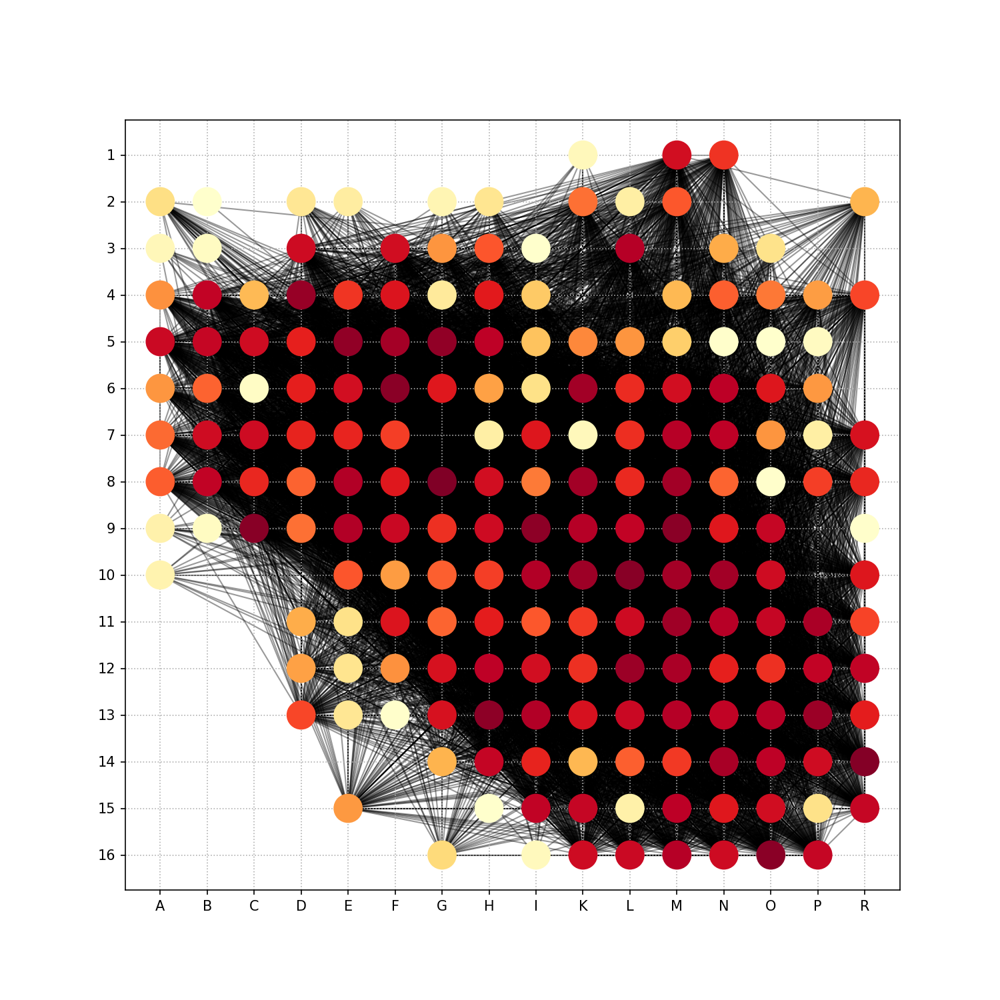

In [88]:
fig, ax = plt.subplots(1,1, figsize=(10,10))

p = nx.degree_centrality(G)

nx.draw_networkx_edges(G, pos, alpha=0.4, ax=ax, cmap='viridis')

nx.draw_networkx_nodes(
    G,
    pos,
    #node_size=([G.nodes[v]['degree_centrality'] for v in G]*10),
    node_size = 400,
    node_color=list(p.values()),
    #edgecolors=
    cmap=plt.cm.YlOrRd,
    #cmap='viridis',

    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
#ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
'''
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])
'''

plt.show()

#fig.savefig('pseudo_anatomy_burst_graph_directions'+filebase+'_.png', dpi = 300, transparent=True)
#fig.savefig('cortex_div11_aCSF_ID046_30µMNorepinephrine_spont_1_burst_connections_dic_graph.png', dpi=300, bbox_inches='tight')


<IPython.core.display.Javascript object>


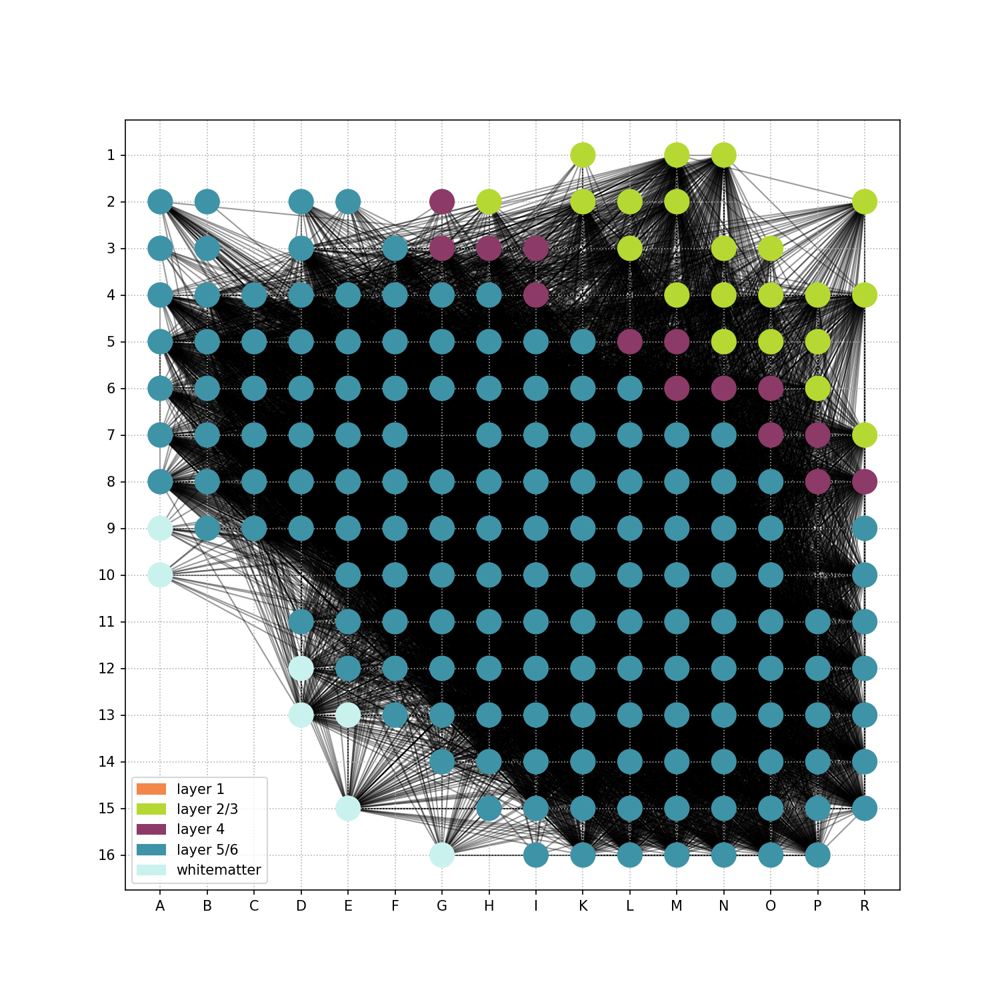

<ipython-input-90-e8e9e8144084>:44: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-90-e8e9e8144084>:44: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-90-e8e9e8144084>:44: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-90-e8e9

In [90]:
fig, ax = plt.subplots(1,1, figsize=(10,10))


nx.draw_networkx_edges(
    G,
    pos, 
    alpha=0.4, 
    edge_color='#000000',
    ax=ax,
)


from itertools import count
# get unique groups
groups = set(nx.get_node_attributes(G,'color').values())
mapping = dict(zip(sorted(groups),count()))


nodes = G.nodes()
colors = [mapping[G.nodes[n]['color']] for n in nodes]


nx.draw_networkx_nodes(
    G,
    pos,
    node_size=300,
    node_color=color.values(),
    #cmap='viridis',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

#fig.savefig('pseudo_anatomy_burst_graph_'+filebase+'_.png', dpi = 300, transparent=True)

### Betweenness Centrality and components.

We can calculate components of the original graph G. This is interesting for larger networks. 

In [91]:
components = nx.connected_components(G)

In [92]:
# find the largest component
largest_component = max(components, key=len)

In [93]:
len(largest_component), len(G.nodes())

(192, 192)

In [94]:
# make a subgraph of the largest component
H = G.subgraph(largest_component)

In [95]:
# calculate the betweenness centrality

centrality = nx.betweenness_centrality(H, k=10, endpoints = True)

In [96]:
centrality

{'R12': 0.007668488719553594,
 'L10': 0.022699830004361966,
 'O10': 0.006559740030429508,
 'P11': 0.008744420013143735,
 'L9': 0.006950985021483764,
 'N9': 0.005617524930436237,
 'M8': 0.009867067863283376,
 'R8': 0.005354316779785308,
 'O6': 0.005608954788460872,
 'N7': 0.008372041956079426,
 'R4': 0.005258596864161107,
 'K6': 0.05890679130062482,
 'I8': 0.005235602094240838,
 'M1': 0.006321178683674806,
 'H5': 0.007762317677628171,
 'F3': 0.0075454334537779595,
 'N13': 0.007188115235778371,
 'O14': 0.007677499878213032,
 'R13': 0.005514835654366946,
 'L11': 0.006407464359321215,
 'O11': 0.0061714410941028095,
 'P12': 0.006823517318885415,
 'M9': 0.021919417167837133,
 'N10': 0.1087329402041646,
 'L8': 0.005492794069095843,
 'O7': 0.005235602094240838,
 'N8': 0.00524496332403897,
 'P6': 0.005235602094240838,
 'L7': 0.005873437709706394,
 'N4': 0.005255884875841334,
 'N1': 0.005314641397914071,
 'L6': 0.005402012466692586,
 'L3': 0.008132779640143719,
 'M2': 0.005263865272761331,
 'G3'

In [97]:
# 
lpc = nx.community.label_propagation_communities(H)

In [98]:
# get different community indexes
community_index = {n: i for i, com in enumerate(lpc) for n in com}

In [99]:
# observe them
community_index

{'A7': 0,
 'R12': 0,
 'N8': 0,
 'A2': 0,
 'A9': 0,
 'O7': 0,
 'F13': 0,
 'F8': 0,
 'O16': 0,
 'P11': 0,
 'O8': 0,
 'D7': 0,
 'B4': 0,
 'B6': 0,
 'O10': 0,
 'P5': 0,
 'I9': 0,
 'M16': 0,
 'G3': 0,
 'F11': 0,
 'A6': 0,
 'O5': 0,
 'K6': 0,
 'F12': 0,
 'E6': 0,
 'H10': 0,
 'D13': 0,
 'H5': 0,
 'I13': 0,
 'A4': 0,
 'E11': 0,
 'B8': 0,
 'K11': 0,
 'K2': 0,
 'E10': 0,
 'P12': 0,
 'L3': 0,
 'I7': 0,
 'A8': 0,
 'G13': 0,
 'L6': 0,
 'R7': 0,
 'I8': 0,
 'G14': 0,
 'R11': 0,
 'E9': 0,
 'H4': 0,
 'B3': 0,
 'H15': 0,
 'M2': 0,
 'F10': 0,
 'N3': 0,
 'G8': 0,
 'M7': 0,
 'E5': 0,
 'K8': 0,
 'H8': 0,
 'C7': 0,
 'D4': 0,
 'H14': 0,
 'I14': 0,
 'G9': 0,
 'L12': 0,
 'M1': 0,
 'K16': 0,
 'F6': 0,
 'G2': 0,
 'A5': 0,
 'L2': 0,
 'L5': 0,
 'R15': 0,
 'G12': 0,
 'N6': 0,
 'N7': 0,
 'P15': 0,
 'R14': 0,
 'N11': 0,
 'F3': 0,
 'G11': 0,
 'H3': 0,
 'D8': 0,
 'R10': 0,
 'I5': 0,
 'H2': 0,
 'L10': 0,
 'H11': 0,
 'E4': 0,
 'L13': 0,
 'L14': 0,
 'N12': 0,
 'N9': 0,
 'F7': 0,
 'D5': 0,
 'M6': 0,
 'M9': 0,
 'C8': 0,
 'K1

<IPython.core.display.Javascript object>


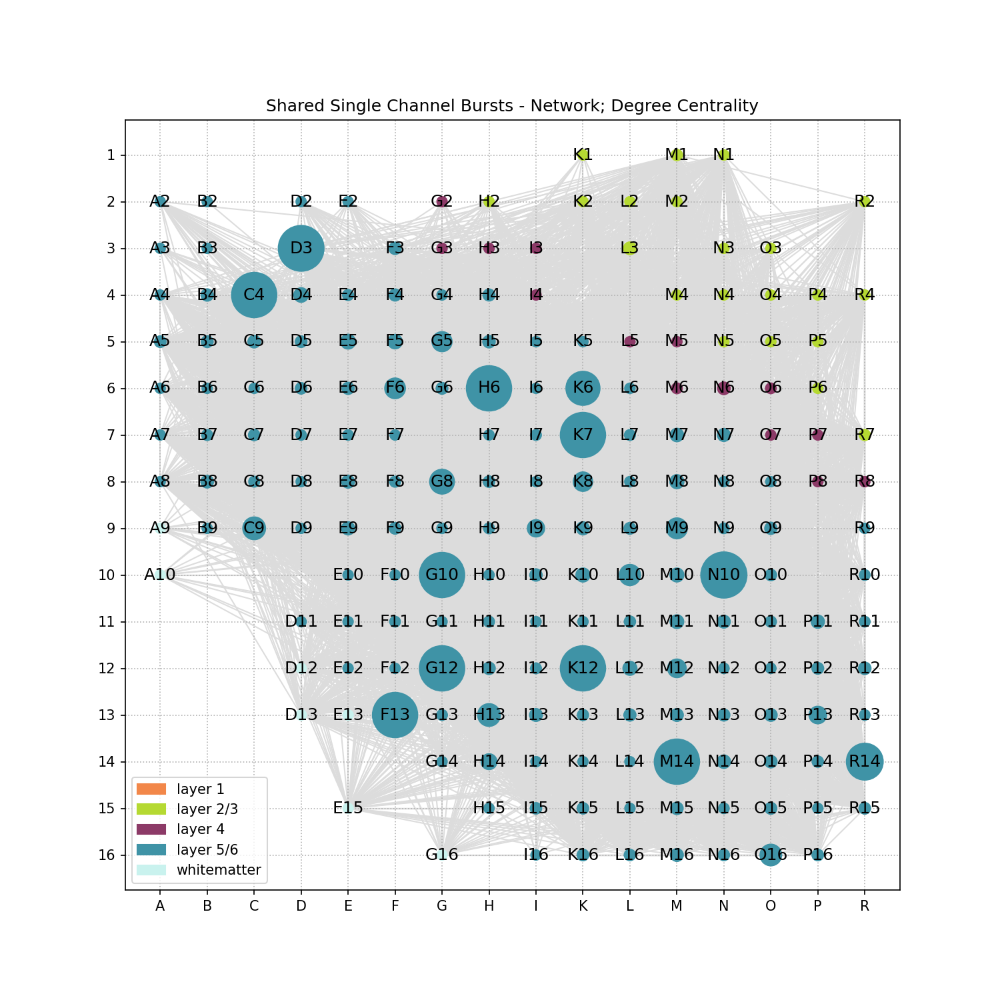

<ipython-input-100-4f0629967751>:50: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-100-4f0629967751>:50: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-100-4f0629967751>:50: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-100-

In [100]:
# degree centrality

for i in H.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    H.nodes[node_key]['pos']=coordinate
    H.nodes[node_key]['layer']=inverted_layerdic[i]
    H.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    H.nodes[node_key]['degree_centrality']=nx.degree_centrality(G)[i]
    H.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]


pos = nx.get_node_attributes(H, 'pos')
layer = nx.get_node_attributes(H, 'layer')
color = nx.get_node_attributes(H, 'color')
bursting_time_normalized = nx.get_node_attributes(H, 'bursting_time_normalized')

# plot the figures
fig, ax = plt.subplots(1,1, figsize=(10,10))


nodes = H.nodes()
# colors = [mapping[H.nodes[n]['color']] for n in nodes]
node_size = [v * 10000 for v in centrality.values()]
#node_size = [v * 5000 for v in bursting_time_normalized.values()]


nx.draw_networkx(
    H,
    pos,
    node_size=node_size,
    node_color=color.values(),
    edge_color='gainsboro',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
ax.set_title('Shared Single Channel Bursts - Network; Degree Centrality')

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

fig.savefig('190416_'+filename+'_betweenness_centrality.png', dpi = 300, bbox_inches='tight', transparent=True)

<IPython.core.display.Javascript object>


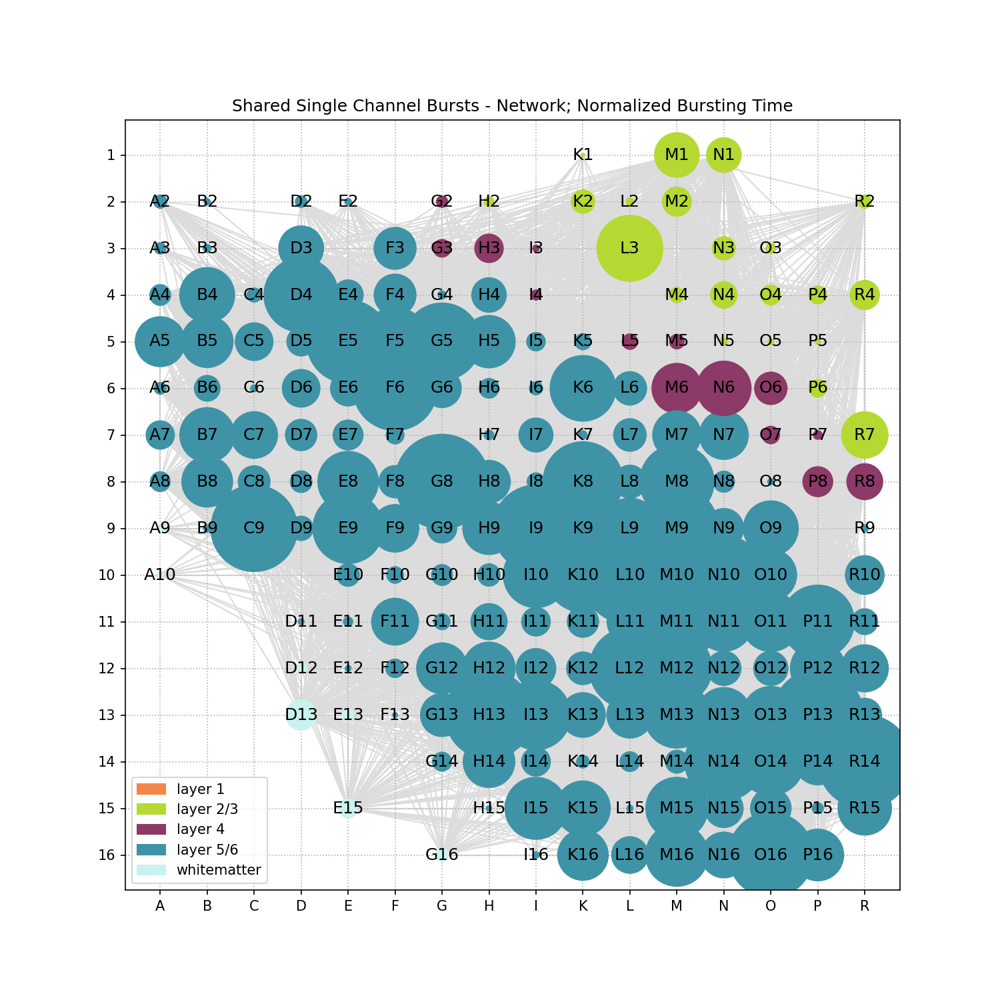

<ipython-input-106-697e7e501f73>:50: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-106-697e7e501f73>:50: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-106-697e7e501f73>:50: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-106-

In [106]:
# normalized bursting time

for i in H.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    H.nodes[node_key]['pos']=coordinate
    H.nodes[node_key]['layer']=inverted_layerdic[i]
    H.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    H.nodes[node_key]['degree_centrality']=nx.degree_centrality(G)[i]
    H.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]


pos = nx.get_node_attributes(H, 'pos')
layer = nx.get_node_attributes(H, 'layer')
color = nx.get_node_attributes(H, 'color')
bursting_time_normalized = nx.get_node_attributes(H, 'bursting_time_normalized')

# plot the figures
fig, ax = plt.subplots(1,1, figsize=(10,10))


nodes = H.nodes()
# colors = [mapping[H.nodes[n]['color']] for n in nodes]
#node_size = [v * 10000 for v in centrality.values()]
node_size = [v * 5000 for v in bursting_time_normalized.values()]


nx.draw_networkx(
    H,
    pos,
    node_size=node_size,
    node_color=color.values(),
    edge_color='gainsboro',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
ax.set_title('Shared Single Channel Bursts - Network; Normalized Bursting Time')

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

fig.savefig('190416_'+filename+'_normalized_bursting_time.png', dpi = 300, bbox_inches='tight', transparent=True)

https://www.analyticsvidhya.com/blog/2018/04/introduction-to-graph-theory-network-analysis-python-codes/

### Centrality
One of the most widely used and important conceptual tools for analysing networks. Centrality aims to find the most important nodes in a network. There may be different notions of “important” and hence there are many centrality measures. Centrality measures themselves have a form of classification (or Types of centrality measures). There are measures that are characterized by flow along the edges and those that are characterized by Walk Structure.

Some of the most commonly used ones are:

    Degree Centrality – The first and conceptually the simplest Centrality definition. This is the number of edges connected to a node. In the case of a directed graph, we can have 2 degree centrality measures. Inflow and Outflow Centrality
    Closeness Centrality – Of a node is the average length of the shortest path from the node to all other nodes
    Betweenness Centrality – Number of times a node is present in the shortest path between 2 other nodes

These centrality measures have variants and the definitions can be implemented using various algorithms. All in all, this means a large number of definitions and algorithms.

 

### Network based on Binned Spiketrain Correlation:



STs are binned and a Pearson Correlation is calculated for each channel. Correlation Matrix is shown as Heatmap.

From Correlation Coeff, Network correlations are calculated.

In [199]:
# bin the spikedictionaries per channel or unit into bins, the recording time needs to be generalized
binsize = 100 # in miliseconds
scale_factor_for_milisecond = 1e-03
binned_spike_dictionary = {}


bins= np.arange(0, timelengthrecording_s*1000+binsize, binsize) # times 1000 to get the miliseconds
for key in st_channel:
    x = np.asarray(st_channel[key])*scale_factor_for_milisecond*tick
    binned_channel = np.histogram(x, bins)
    binned_spike_dictionary[key]  = binned_channel[0]

In [200]:
df = pd.DataFrame(data=binned_spike_dictionary)

In [201]:
correlated = df.corr(method='pearson')

In [202]:
correlated['A12']

R12    0.043221
L10    0.002774
O10    0.063349
P11    0.032494
L9     0.012356
         ...   
K12    0.083225
K14    0.090330
L15    0.173613
E5     0.018042
D1     0.398943
Name: A12, Length: 252, dtype: float64

<IPython.core.display.Javascript object>


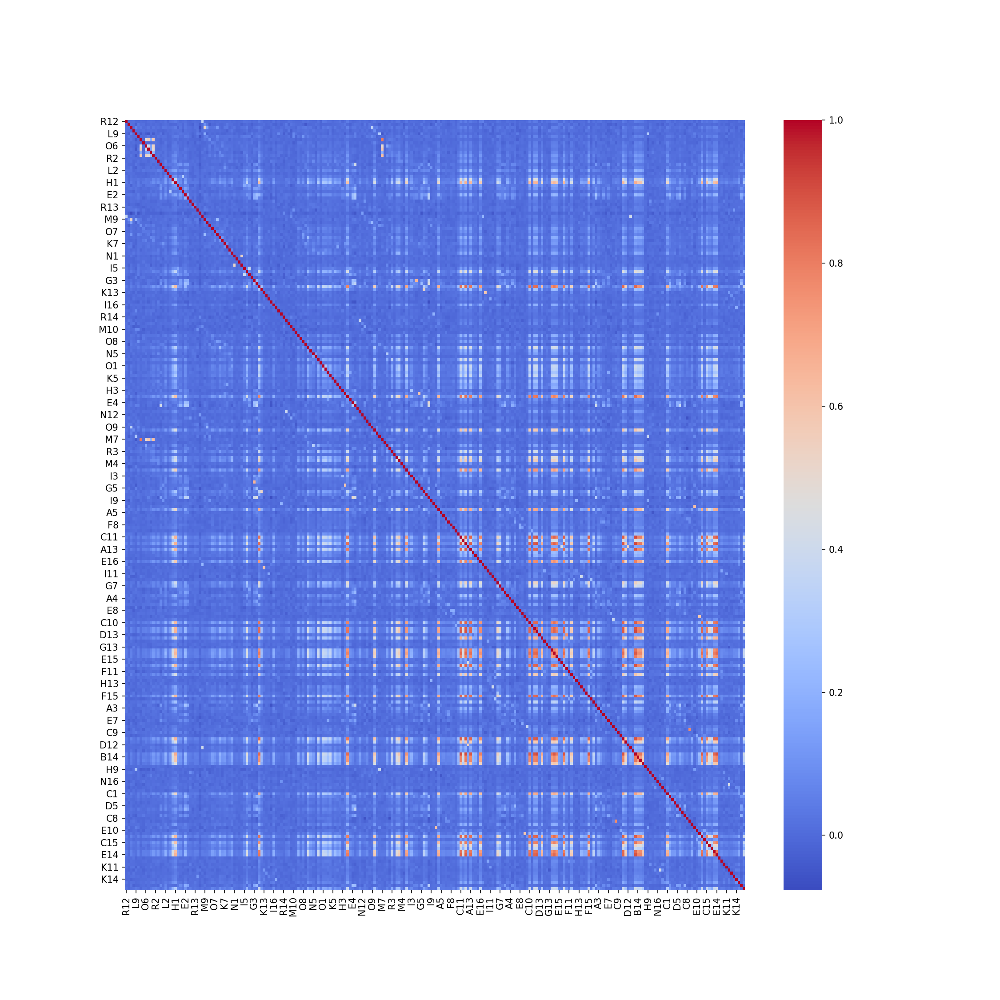

In [203]:
fig, ax = plt.subplots(1,1, figsize=(15,15))

sns.heatmap(correlated, ax=ax, cmap='coolwarm')


fig.savefig(filename+'correlation_matrix_10ms_binned_spiketrains.png', dpi=300, bbox_inches='tight')

In [204]:
correlated

,R12,L10,O10,P11,L9,N9,M8,R8,O6,N7,...,G11,M14,K11,L13,M16,K12,K14,L15,E5,D1
R12,1.000000,0.000073,0.014528,0.017349,0.001701,0.003085,0.005061,-0.000276,-0.002378,0.010405,...,0.004286,0.004635,0.011145,-0.005886,-0.003217,0.001234,-0.001718,0.020334,0.007238,0.016861
L10,0.000073,1.000000,0.016549,0.009040,-0.023183,0.033782,0.008136,0.014304,-0.006160,0.001639,...,-0.008275,0.005851,-0.013197,-0.014286,0.009815,0.002765,-0.003215,-0.001886,-0.006742,-0.007030
O10,0.014528,0.016549,1.000000,0.002220,0.067984,0.016234,0.032335,0.006034,0.007781,0.026171,...,0.012031,0.009756,0.022679,0.003292,-0.000953,0.013531,-0.013524,0.017147,0.025488,0.013498
P11,0.017349,0.009040,0.002220,1.000000,0.007943,0.007651,0.003467,0.012825,0.003195,0.011441,...,0.008973,0.009625,0.024841,-0.016690,0.024806,0.018378,-0.002786,0.012069,-0.021043,0.017206
L9,0.001701,-0.023183,0.067984,0.007943,1.000000,0.009929,-0.044280,-0.004517,-0.033219,-0.049801,...,0.001459,0.005563,-0.021732,0.023754,0.001810,0.011725,0.000523,0.001099,-0.007647,0.041121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
K12,0.001234,0.002765,0.013531,0.018378,0.011725,0.015049,0.002576,0.008791,0.008189,-0.006208,...,0.008192,0.015532,0.021880,0.009806,-0.006678,1.000000,0.025899,0.024372,-0.013381,0.044288
K14,-0.001718,-0.003215,-0.013524,-0.002786,0.000523,0.000748,0.004929,0.003502,0.005058,0.014979,...,0.005472,0.033412,0.011633,0.050133,0.001217,0.025899,1.000000,0.093248,-0.004116,0.038340
L15,0.020334,-0.001886,0.017147,0.012069,0.001099,0.007161,0.014195,0.007743,0.022638,0.013162,...,0.013511,0.058248,0.013132,0.045853,0.014713,0.024372,0.093248,1.000000,-0.007022,0.078575
E5,0.007238,-0.006742,0.025488,-0.021043,-0.007647,-0.005726,0.003830,0.009185,0.001461,0.014987,...,-0.004178,0.004709,-0.005767,0.000522,-0.021580,-0.013381,-0.004116,-0.007022,1.000000,0.014909


In [205]:
correlated['R12']['L10']

7.294901704374717e-05

In [206]:
# get correlation coefficient for connection dictionary

correlation_dic = {}
correlation_threshold = 0.5

correlated_list = []

for i in all_channels:
    correlated_list = []
    for j in all_channels:
        if correlated[i][j] > correlation_threshold:
            if i != j:
                correlated_list.append(j)
    correlation_dic[i] = correlated_list

In [207]:
correlation_dic

{'D1': [],
 'E1': ['F1',
  'H1',
  'L1',
  'P2',
  'B1',
  'C1',
  'P10',
  'A11',
  'B10',
  'B11',
  'C10',
  'C11',
  'C12',
  'C13',
  'D14',
  'E14',
  'F14',
  'F15',
  'F16',
  'G15',
  'A12',
  'A13',
  'A15',
  'B13',
  'B14',
  'B16',
  'C14',
  'C15',
  'D15',
  'D16',
  'E16'],
 'F1': ['E1',
  'H1',
  'L1',
  'P2',
  'B1',
  'C1',
  'P10',
  'A11',
  'B10',
  'B11',
  'C10',
  'C11',
  'C12',
  'C13',
  'D14',
  'E14',
  'F14',
  'F15',
  'F16',
  'G15',
  'A12',
  'A13',
  'A15',
  'B13',
  'B14',
  'B16',
  'C14',
  'C15',
  'D15',
  'D16',
  'E16'],
 'G1': ['F2'],
 'H1': ['E1',
  'F1',
  'L1',
  'B1',
  'C1',
  'A11',
  'B11',
  'C10',
  'C11',
  'C12',
  'C13',
  'E14',
  'F14',
  'F15',
  'F16',
  'G15',
  'A12',
  'A13',
  'A15',
  'B13',
  'B14',
  'B16',
  'C15',
  'D16',
  'E16'],
 'I1': [],
 'I2': [],
 'K1': [],
 'K2': [],
 'L1': ['E1',
  'F1',
  'H1',
  'B1',
  'C1',
  'A11',
  'B11',
  'C10',
  'C11',
  'C12',
  'C13',
  'E14',
  'F14',
  'F15',
  'F16',
  'G15'

In [208]:
J = nx.Graph()

for key in correlation_dic:
    for i in correlation_dic[key]:
        J.add_edge(key, i)

In [209]:
for i in J.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    J.nodes[node_key]['pos']=coordinate
    J.nodes[node_key]['layer']=inverted_layerdic[i]
    J.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    J.nodes[node_key]['degree_centrality']=nx.degree_centrality(J)[i]
    J.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]

In [210]:
components = nx.connected_components(J)

# find the largest component
largest_component = max(components, key=len)

In [211]:
K = J.subgraph(largest_component)


In [212]:
centrality_J = nx.betweenness_centrality(J, k=10, endpoints = True)
centrality_K = nx.betweenness_centrality(K, k=10, endpoints = True)

In [213]:
pos = nx.get_node_attributes(J, 'pos')
layer = nx.get_node_attributes(J, 'layer')
color = nx.get_node_attributes(J, 'color')
burst_time = nx.get_node_attributes(J, 'bursting_time_normalized')

In [214]:
pos = nx.get_node_attributes(K, 'pos')
layer = nx.get_node_attributes(K, 'layer')
color = nx.get_node_attributes(K, 'color')
burst_time = nx.get_node_attributes(K, 'bursting_time_normalized')

In [215]:
lpc = nx.community.label_propagation_communities(K)

In [216]:
# get different community indexes
community_index = {n: i for i, com in enumerate(lpc) for n in com}

In [217]:
community_index

{'P2': 0,
 'F16': 0,
 'A15': 0,
 'C14': 0,
 'B11': 0,
 'B1': 0,
 'L1': 0,
 'P10': 0,
 'C1': 0,
 'A13': 0,
 'A11': 0,
 'H16': 0,
 'B10': 0,
 'C12': 0,
 'D15': 0,
 'H1': 0,
 'F15': 0,
 'C13': 0,
 'C10': 0,
 'B15': 0,
 'E1': 0,
 'A12': 0,
 'F1': 0,
 'C11': 0,
 'F14': 0,
 'B13': 0,
 'C15': 0,
 'D14': 0,
 'B16': 0,
 'B14': 0,
 'G15': 0,
 'E16': 0,
 'E14': 0,
 'D16': 0,
 'O2': 0}

<IPython.core.display.Javascript object>


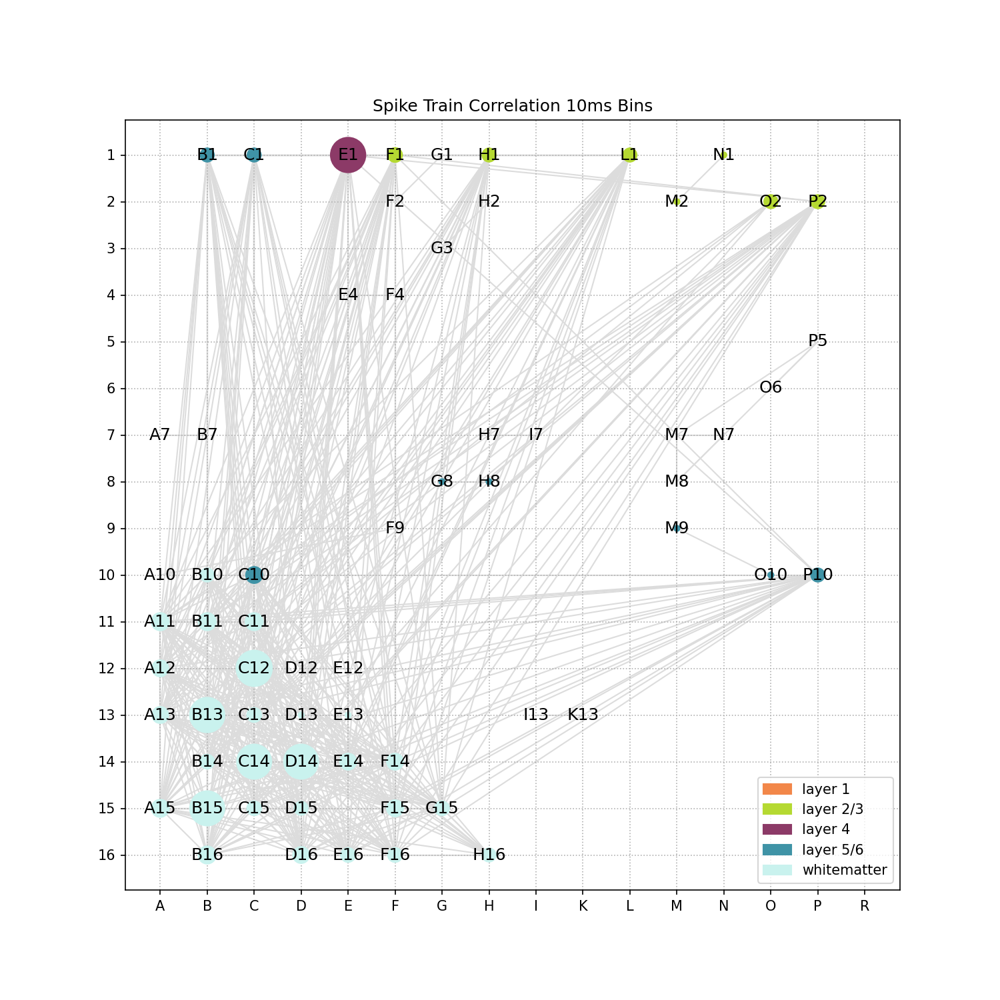

<ipython-input-218-0007249eeb03>:50: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-218-0007249eeb03>:50: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-218-0007249eeb03>:50: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-218-

In [218]:
# normalized bursting time

for i in J.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    J.nodes[node_key]['pos']=coordinate
    J.nodes[node_key]['layer']=inverted_layerdic[i]
    J.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    J.nodes[node_key]['degree_centrality']=nx.degree_centrality(J)[i]
    J.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]


pos = nx.get_node_attributes(J, 'pos')
layer = nx.get_node_attributes(J, 'layer')
color = nx.get_node_attributes(J, 'color')


# plot the figures
fig, ax = plt.subplots(1,1, figsize=(10,10))


nodes = J.nodes()
# colors = [mapping[H.nodes[n]['color']] for n in nodes]
node_size = [v * 10000 for v in centrality_J.values()]
#node_size = [v * 5000 for v in bursting_time_normalized.values()]


nx.draw_networkx(
    J,
    pos,
    node_size=node_size,
    node_color=color.values(),
    edge_color='gainsboro',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
ax.set_title('Spike Train Correlation 10ms Bins')

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

fig.savefig('190416_'+filename+'_spiketrain_correlation.png', dpi = 300, bbox_inches='tight', transparent=True)

<IPython.core.display.Javascript object>


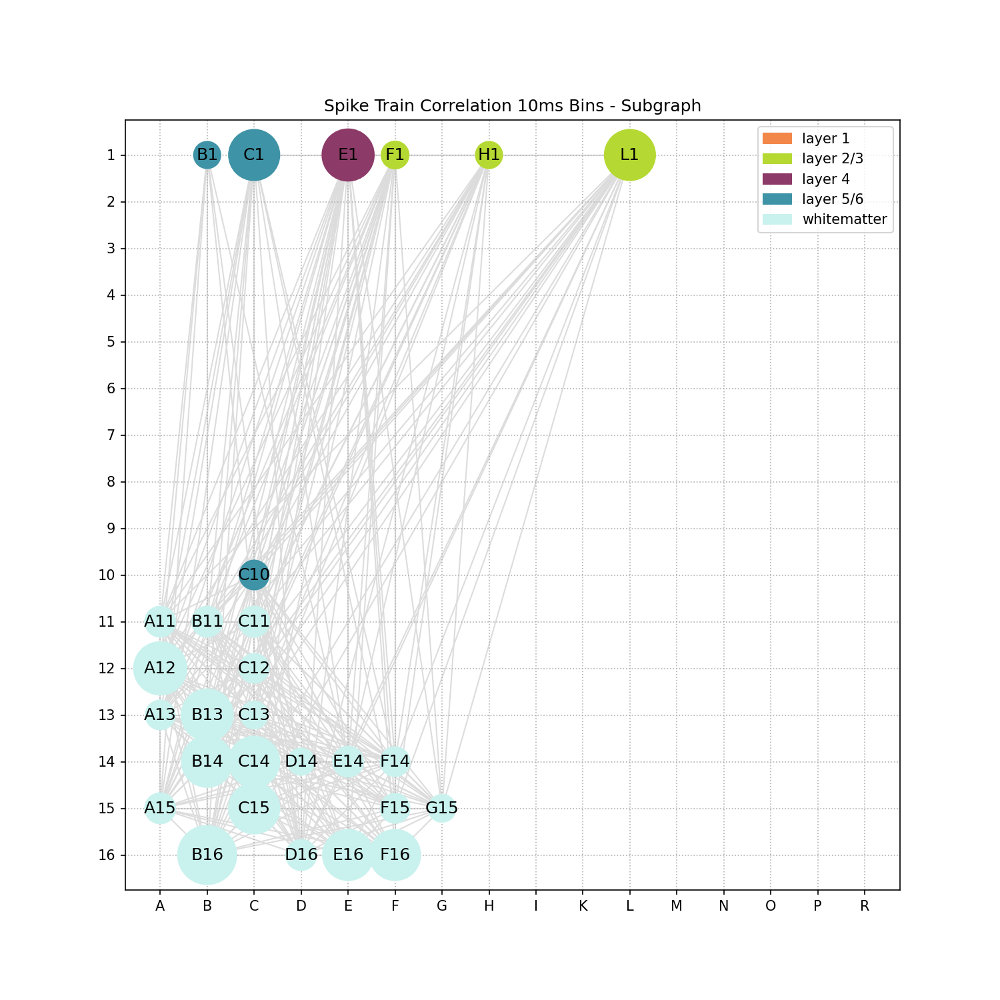

<ipython-input-139-b6ebb703e7ea>:50: UserWarning: Legend does not support '#F28749' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-139-b6ebb703e7ea>:50: UserWarning: Legend does not support '#B5D932' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-139-b6ebb703e7ea>:50: UserWarning: Legend does not support '#8C3A67' instances.
A proxy artist may be used instead.
See: https://matplotlib.org/users/legend_guide.html#creating-artists-specifically-for-adding-to-the-legend-aka-proxy-artists
  ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
<ipython-input-139-

In [139]:
# spiketrain correlation subgraph 

for i in K.nodes():
    node_key = i
    coordinate = mea_positional_coordinates_dic[node_key]
    K.nodes[node_key]['pos']=coordinate
    K.nodes[node_key]['layer']=inverted_layerdic[i]
    K.nodes[node_key]['color']=layer_colors[inverted_layerdic[i]]
    K.nodes[node_key]['degree_centrality']=nx.degree_centrality(K)[i]
    K.nodes[node_key]['bursting_time_normalized']=normalized_bursting_time_per_unit_dic[i]


pos = nx.get_node_attributes(K, 'pos')
layer = nx.get_node_attributes(K, 'layer')
color = nx.get_node_attributes(K, 'color')


# plot the figures
fig, ax = plt.subplots(1,1, figsize=(10,10))


nodes = K.nodes()
# colors = [mapping[H.nodes[n]['color']] for n in nodes]
node_size = [v * 10000 for v in centrality_K.values()]
#node_size = [v * 5000 for v in bursting_time_normalized.values()]


nx.draw_networkx(
    K,
    pos,
    node_size=node_size,
    node_color=color.values(),
    edge_color='gainsboro',
    ax=ax
)


ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xticks(mea_coordinates)
ax.set_yticks(mea_coordinates)
ax.set_xticklabels(columnlist)
ax.set_yticklabels([16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1])
ax.set_title('Spike Train Correlation 10ms Bins - Subgraph')

ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

ax.grid(ls=':')
#plt.axis("off")
ax.legend(handles=layer_colors.values(), labels=layer_colors.keys())
layer1 = mpatches.Patch(color='#F28749', label='layer 1')
layer23 = mpatches.Patch(color='#B5D932', label='layer 2/3')
layer4 = mpatches.Patch(color='#8C3A67', label='layer 4')
layer56 = mpatches.Patch(color='#3F93A6', label='layer 5/6')
wm = mpatches.Patch(color='#C9F2EE', label='whitematter')
plt.legend(handles=[layer1, layer23, layer4, layer56, wm])

#plt.yticks(mea_coordinates, columnlist)
#plt.xticks(list(mea_coordinates), columnlist)
plt.show()

fig.savefig('190416_'+filename+'_spiketrain_correlation_subgraph_biggest.png', dpi = 300, bbox_inches='tight', transparent=True)

In [147]:
J.nodes

NodeView(('E1', 'A11', 'B10', 'C11', 'C12', 'C13', 'E14', 'F14', 'A12', 'A13', 'A14', 'A15', 'B13', 'B14', 'B15', 'B16', 'C15', 'D16', 'K1', 'L1', 'G3', 'F4', 'F15', 'E16', 'C5', 'D6', 'C6', 'C7', 'D4', 'D5', 'E5', 'E6', 'E7', 'F5', 'F6', 'F9', 'G5', 'G4', 'H4', 'G6', 'E9', 'E12', 'F12', 'H5', 'H6', 'F16', 'G12', 'H12', 'G15', 'I5', 'I6', 'H7', 'I7', 'H8', 'K6', 'I8', 'K7', 'K8', 'L6'))

In [149]:
df['A12'].sum()


33

In [151]:
len(spikedic_MAD['A12'])

33